In this notebook we are utilizing textual data of various articles that are either truthfull and factual texts or fake news. As you will see most of the articles are political news. Given this set we will try to make a model that is able to classify fake and true articles, but doesn't only work on political news text, but possibly any given text extracted from the internet.

In [ ]:
pip install optuna pytorch_lightning lime

In [ ]:
import zipfile
import os
import re
import string
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, RocCurveDisplay, roc_curve
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.tree import export_graphviz
from sklearn.tree import plot_tree
from sentence_transformers import SentenceTransformer
import optuna
import torch
import spacy
import torch
from torch.utils.data import Dataset, DataLoader
from torch.nn import functional as F
from torch import nn
import pytorch_lightning as pl
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from transformers import BertTokenizer
from pytorch_lightning.loggers import CSVLogger
from transformers import AutoTokenizer, AutoModelForSequenceClassification, AdamW
from sklearn.utils.class_weight import compute_class_weight
from lime.lime_text import LimeTextExplainer
from transformers import AutoTokenizer

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

### Data splitting

70% for training, 15% validation and test.

In [ ]:
combined_data_copy = pd.read_csv("combined_data_cleaned.csv")

In [ ]:
train_data, temp_data = train_test_split(
    combined_data_copy, test_size=0.3, stratify=combined_data_copy["label"], random_state=42
)
val_data, test_data = train_test_split(
    temp_data, test_size=0.5, stratify=temp_data["label"], random_state=42
)

### Feature engineering

We are basicing feature engineering on our findings from the EDA where we have explored each labels distributions based on these feature. Visually these features demonstrated significant differences that could be crucial for distinguishing between false and true texts.

In [ ]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

In [ ]:
stop_words = set(stopwords.words('english'))

In [ ]:
def normalize_text(text):
    text = text.lower()
    text = re.sub(r"'s\b", "", text)
    text = re.sub(r"http\S+", "<URL>", text)
    text = re.sub(r"\d+", "<NUMBER>", text)
    text = re.sub(r"[^a-z\s]", " ", text)
    text = re.sub(r"\s+", " ", text).strip()
    return text

In [ ]:
def remove_stopwords(text):
    return " ".join(word for word in text.split() if word.lower() not in stop_words)

In [ ]:
def calculate_avg_word_length(text):
    words = text.split()
    return sum(len(word) for word in words) / len(words) if words else 0

In [ ]:
def calculate_sentence_count(text):
    return text.count('.') + text.count('!') + text.count('?')

In [ ]:
def symbol_ratio(text, symbol):
    return text.count(symbol) / len(text) if len(text) > 0 else 0

In [ ]:
def symbol_to_word_ratio(text):
    total_words = len(text.split())
    symbol_count = sum(1 for char in text if not char.isalnum() and not char.isspace())
    return symbol_count / total_words if total_words > 0 else 0

In [ ]:
def count_stop_words(text):
    if not isinstance(text, str):
        return 0
    tokens = text.translate(str.maketrans('', '', string.punctuation)).split()
    return sum(1 for word in tokens if word.lower() in stop_words)

In [ ]:
def preprocess_and_engineer_features(dataset):
    dataset["text"] = dataset["text"].str.strip()
    dataset["title"] = dataset["title"].str.strip()
    dataset = dataset[(dataset["text"] != "") & (dataset["title"] != "")]
    dataset["cleaned_text"] = dataset["text"].apply(normalize_text)
    dataset["cleaned_title"] = dataset["title"].apply(normalize_text)

    dataset["cleaned_and_without_stop_text"] = dataset["cleaned_text"].apply(remove_stopwords)
    dataset["cleaned_and_without_stop_title"] = dataset["cleaned_title"].apply(remove_stopwords)

    dataset["char_count"] = dataset["text"].apply(len)
    dataset["word_count"] = dataset["text"].apply(lambda x: len(x.split()))
    dataset["unique_word_count"] = dataset["text"].apply(lambda x: len(set(x.split())))
    dataset["avg_word_length"] = dataset["text"].apply(calculate_avg_word_length)
    dataset["sentence_count"] = dataset["text"].apply(calculate_sentence_count)
    dataset["symbol_to_word_ratio"] = dataset["text"].apply(symbol_to_word_ratio)
    dataset["capital_letter_ratio"] = dataset["text"].apply(
        lambda x: sum(1 for c in x if c.isupper()) / len(x) if len(x) > 0 else 0
    )
    dataset["special_char_ratio"] = dataset["text"].apply(
        lambda x: sum(1 for c in x if not c.isalnum() and not c.isspace()) / len(x) if len(x) > 0 else 0
    )
    dataset["comma_ratio"] = dataset["text"].apply(lambda x: x.count(",") / len(x) if len(x) > 0 else 0)
    dataset["period_ratio"] = dataset["text"].apply(lambda x: x.count(".") / len(x) if len(x) > 0 else 0)
    dataset["question_mark_ratio"] = dataset["text"].apply(lambda x: x.count("?") / len(x) if len(x) > 0 else 0)
    dataset["exclamation_mark_ratio"] = dataset["text"].apply(lambda x: x.count("!") / len(x) if len(x) > 0 else 0)
    dataset["ellipses_ratio"] = dataset["text"].apply(lambda x: x.count("...") / len(x) if len(x) > 0 else 0)
    dataset["url_count_ratio"] = dataset["text"].apply(lambda x: (x.count("http") + x.count("www")) / len(x) if len(x) > 0 else 0)
    dataset["hashtag_ratio"] = dataset["text"].apply(lambda x: symbol_ratio(x, "#"))
    dataset["at_ratio"] = dataset["text"].apply(lambda x: symbol_ratio(x, "@"))
    dataset["quote_ratio"] = dataset["text"].apply(lambda x: symbol_ratio(x, '"'))
    dataset["title_char_count"] = dataset["title"].apply(len)
    dataset["title_word_count"] = dataset["title"].apply(lambda x: len(x.split()))
    dataset["title_unique_word_count"] = dataset["title"].apply(lambda x: len(set(x.split())))
    dataset["avg_word_length_title"] = dataset["title"].apply(calculate_avg_word_length)
    dataset["stop_word_count_title"] = dataset["title"].apply(count_stop_words)
    dataset["stop_word_ratio_title"] = dataset["stop_word_count_title"] / dataset["title_word_count"].replace(0, 1)
    dataset["cleaned_word_lengths"] = dataset["cleaned_and_without_stop_text"].apply(lambda x: [len(word) for word in x.split()])
    dataset["cleaned_title_word_lengths"] = dataset["cleaned_and_without_stop_title"].apply(lambda x: [len(word) for word in x.split()])

    return dataset

In [ ]:
train_df = preprocess_and_engineer_features(train_data)
val_df = preprocess_and_engineer_features(val_data)
test_df = preprocess_and_engineer_features(test_data)

### Embedding clustering.

Before proceeding with modeling we want to do an additional anomaly search using sentence embeddings with the all-MiniLM-L6-v2 transformer model. By clustering these embeddings into two groups using KMeans we explore how the labels are distributed across those clusters. This helps us identify potential anomalies or patterns in the data that might influence model performance.

In [ ]:
embedding_model = SentenceTransformer('all-MiniLM-L6-v2', device=device)

In [ ]:
train_embeddings = embedding_model.encode(train_df['cleaned_text'].tolist(), show_progress_bar=True)
val_embeddings = embedding_model.encode(val_df['cleaned_text'].tolist(), show_progress_bar=True)
test_embeddings = embedding_model.encode(test_df['cleaned_text'].tolist(), show_progress_bar=True)

Batches:   0%|          | 0/840 [00:00<?, ?it/s]

Batches:   0%|          | 0/180 [00:00<?, ?it/s]

Batches:   0%|          | 0/180 [00:00<?, ?it/s]

In [ ]:
np.save("train_embeddings.npy", train_embeddings)
np.save("val_embeddings.npy", val_embeddings)
np.save("test_embeddings.npy", test_embeddings)

In [ ]:
print(f"Train embeddings shape: {train_embeddings.shape}")
print(f"Validation embeddings shape: {val_embeddings.shape}")
print(f"Test embeddings shape: {test_embeddings.shape}")

Train embeddings shape: (26860, 384)
Validation embeddings shape: (5756, 384)
Test embeddings shape: (5756, 384)


In [ ]:
n_clusters = 2

In [ ]:
kmeans = KMeans(n_clusters=n_clusters, random_state=42)

In [ ]:
train_cluster_labels = kmeans.fit_predict(train_embeddings)

In [ ]:
print(f"Cluster labels: {np.unique(train_cluster_labels)}")

Cluster labels: [0 1]


In [ ]:
tsne = TSNE(n_components=2, random_state=42)

In [ ]:
embeddings_2d = tsne.fit_transform(train_embeddings)

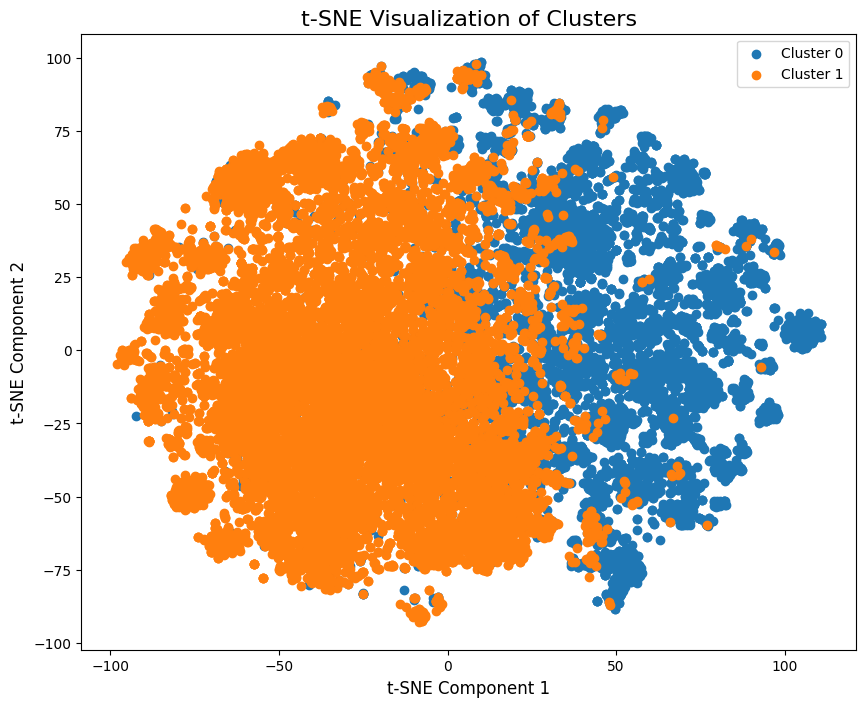

In [ ]:
plt.figure(figsize=(10, 8))
for cluster in np.unique(train_cluster_labels):
    cluster_points = embeddings_2d[train_cluster_labels == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f"Cluster {cluster}")

plt.title("t-SNE Visualization of Clusters", fontsize=16)
plt.xlabel("t-SNE Component 1", fontsize=12)
plt.ylabel("t-SNE Component 2", fontsize=12)
plt.legend()
plt.show()

We observe some overlap between the clusters, as well as distinct differences, indicating that the features capture meaningful patterns while still having areas of ambiguity.

In [ ]:
train_df['cluster'] = train_cluster_labels

In [ ]:
cluster_label_counts = train_df.groupby('cluster')['label'].value_counts()

In [ ]:
print("Cluster and label distribution:")
print(cluster_label_counts)

Cluster and label distribution:
cluster  label
0        True      8960
         False     1332
1        False    10695
         True      5873
Name: count, dtype: int64


Cluster 1 contains a significant proportion of false labels compared to true, while cluster 0 shows a greater representation of true labels. To make embeddings more a like and not dependent on certain words we will do entity masking ans will see how it effects clusters.

In [ ]:
nlp = spacy.load("en_core_web_sm")

Given our EDA results we have selected to make sure these entities are masked, this could be more extensive or more researched, this is based on our findings and some intuition what could potentially create bias in the model and we don't want model to base it predictions only on the source or person indicated but more on the semantic meaning.

In [ ]:
known_entities = {
    "trump": "PERSON",
    "trumps": "PERSON",
    "donald trump": "PERSON",
    "donald": "PERSON",
    "reuters": "ORG",
    "white house": "ORG",
    "fox news": "ORG",
    "cnn": "ORG",
    "cnn news": "ORG",
    "cnn tv": "ORG",
    "twitter": "ORG",
    "twitter com": "ORG",
    "fox": "ORG",
    "fox news": "ORG",
    "wire": "ORG",
    "wire com": "ORG",
    "washington post": "ORG",
    "washington": "ORG"
}

In [ ]:
def mask_entities_in_cleaned_text(text):
    doc = nlp(text)
    tokens = []
    for token in doc:
        if token.text in known_entities:
            tokens.append(f"[{known_entities[token.text]}]")
        elif token.ent_type_ in {"PERSON", "ORG", "GPE", "DATE"}:
            tokens.append(f"[{token.ent_type_}]")
        else:
            tokens.append(token.lemma_)
    return " ".join(tokens)

In [ ]:
train_df['processed_text'] = train_df['cleaned_text'].apply(mask_entities_in_cleaned_text)
train_df['processed_title'] = train_df['cleaned_title'].apply(mask_entities_in_cleaned_text)

In [ ]:
output_file = "preprocessed_clean_train_data.csv"
train_df.to_csv(output_file, index=False)

Validation and test sets are going to be lemmatized, but not masked.

In [ ]:
def preprocess_text(text):
    doc = nlp(text)
    tokens = []
    for token in doc:
        if not token.is_punct:
            tokens.append(token.lemma_.lower())
    return " ".join(tokens)

In [ ]:
val_df["processed_text"] = val_df["cleaned_text"].apply(preprocess_text)
val_df["processed_title"] = val_df["cleaned_title"].apply(preprocess_text)

In [ ]:
test_df["processed_text"] = test_df["cleaned_text"].apply(preprocess_text)
test_df["processed_title"] = test_df["cleaned_title"].apply(preprocess_text)

In [ ]:
output_file = "preprocessed_clean_val_data.csv"
val_df.to_csv(output_file, index=False)

In [ ]:
output_file = "preprocessed_test_clean_data.csv"
test_df.to_csv(output_file, index=False)

In [ ]:
train_df_masked = pd.read_csv("preprocessed_clean_train_data.csv")
val_df_masked = pd.read_csv("preprocessed_clean_val_data.csv")
test_df_masked = pd.read_csv("preprocessed_test_clean_data.csv")

In [ ]:
train_df_masked['processed_text_withoutstops'] = train_df_masked['processed_text'].apply(remove_stopwords)
val_df_masked['processed_text_withoutstops'] = val_df_masked['processed_text'].apply(remove_stopwords)
val_df_masked['processed_text_withoutstops'] = val_df_masked['processed_text'].apply(remove_stopwords)

In [ ]:
train_clean_embeddings = embedding_model.encode(train_df_masked['processed_text'].tolist(), show_progress_bar=True)

Batches:   0%|          | 0/840 [00:00<?, ?it/s]

In [ ]:
np.save("train_clean_embeddings.npy", train_clean_embeddings)

In [ ]:
print(f"Train embeddings shape: {train_clean_embeddings.shape}")

Train embeddings shape: (26860, 384)


In [ ]:
n_clusters = 2

In [ ]:
kmeans = KMeans(n_clusters=n_clusters, random_state=42)

In [ ]:
train_clean_cluster_labels = kmeans.fit_predict(train_clean_embeddings)

In [ ]:
print(f"Cluster labels: {np.unique(train_clean_cluster_labels)}")

Cluster labels: [0 1]


In [ ]:
tsne = TSNE(n_components=2, random_state=42)

In [ ]:
embeddings_2d = tsne.fit_transform(train_clean_embeddings)

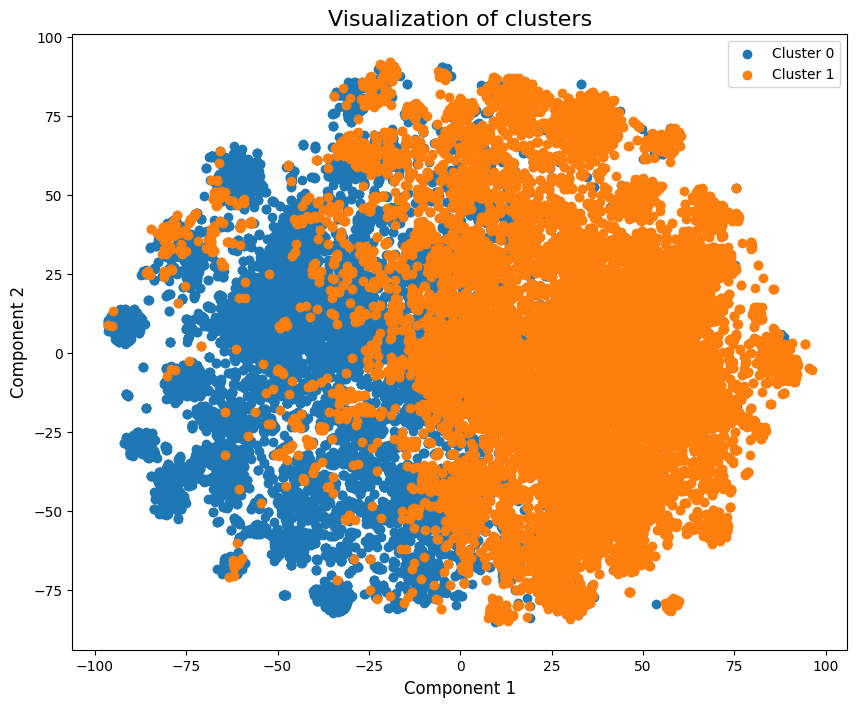

In [ ]:
plt.figure(figsize=(10, 8))
for cluster in np.unique(train_clean_cluster_labels):
    cluster_points = embeddings_2d[train_clean_cluster_labels == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f"Cluster {cluster}")

plt.title("Visualization of clusters", fontsize=16)
plt.xlabel("Component 1", fontsize=12)
plt.ylabel("Component 2", fontsize=12)
plt.legend()
plt.show()

Clusters with masked entities shows a slightly different pattern compared to the unmasked data. While there is still overlap between the clusters masked entities appears to have affected the clustering boundaries a little potentially making them less distinct.

In [ ]:
train_df_masked['cluster'] = train_clean_cluster_labels

In [ ]:
for cluster in range(n_clusters):
    cluster_texts = train_df_masked[train_df_masked['cluster'] == cluster]['processed_text']
    all_words = " ".join(cluster_texts).split()
    top_words = Counter(all_words).most_common(10)
    print(f"Cluster {cluster} - Top Words: {top_words}")

Cluster 0 - Top Words: [('the', 236674), ('to', 132013), ('[ORG]', 125913), ('[GPE]', 124912), ('be', 121267), ('of', 108674), ('[PERSON]', 103234), ('and', 100474), ('[DATE]', 98838), ('a', 98266)]
Cluster 1 - Top Words: [('the', 319784), ('[PERSON]', 230800), ('be', 201125), ('to', 192191), ('[ORG]', 161261), ('of', 147756), ('a', 146885), ('and', 142583), ('in', 115309), ('[DATE]', 112225)]


In [ ]:
cluster_label_counts = train_df_masked.groupby('cluster')['label'].value_counts()

In [ ]:
print("Cluster and label distribution:")
print(cluster_label_counts)

Cluster and label distribution:
cluster  label
0        True      9810
         False     1690
1        False    10337
         True      5023
Name: count, dtype: int64


Entity masking does not appear to have significantly changed the cluster proportions. Interestingly the clusters with masked entities seem now slightly more concentrated even though masking may have reduced reliance on specific names or organizations it might have also introduced uniformity in the text structure and potentially increased semantic similarities.

First lets determine if we can classify text based on its characteristics. During the EDA we observed differences in the distributions of various text and title characteristics.

We will remove highly correlated features to avoid multicollinearity since we will be employing logistic regression for the classification. Given the binary classification task it is a good starting point.

In [ ]:
train_df['numeric_label'] = train_df['label'].replace({'True': 1, 'False': 0}).astype(int)

In [ ]:
val_df['numeric_label'] = val_df['label'].replace({'True': 1, 'False': 0}).astype(int)
test_df['numeric_label'] = test_df['label'].replace({'True': 1, 'False': 0}).astype(int)

In [ ]:
numeric_features = train_df.select_dtypes(include=['int64', 'float64']).copy()

In [ ]:
correlation_matrix = numeric_features.corr()

In [ ]:
label_correlation = correlation_matrix['numeric_label'].drop('numeric_label')

In [ ]:
correlation_threshold = 0.9

In [ ]:
upper_tri = correlation_matrix.where(
    np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool)
)

In [ ]:
features_to_drop = set()

In [ ]:
for column in upper_tri.columns:
    correlated_features = upper_tri.index[upper_tri[column] > correlation_threshold].tolist()

    if correlated_features:
        if column in correlated_features:
            correlated_features.remove(column)

        for feature in correlated_features:
            if label_correlation[feature] < label_correlation[column]:
                features_to_drop.add(feature)
            else:
                features_to_drop.add(column)

In [ ]:
filtered_features = numeric_features.drop(columns=features_to_drop)

print(f"Features to drop: {features_to_drop}")
print(f"Remaining features: {filtered_features.columns.tolist()}")

Features to drop: {'special_char_ratio', 'title_word_count', 'title_unique_word_count', 'unique_word_count', 'word_count', 'sentence_count'}
Remaining features: ['char_count', 'title_char_count', 'question_mark_ratio', 'exclamation_mark_ratio', 'ellipses_ratio', 'url_count_ratio', 'comma_ratio', 'period_ratio', 'capital_letter_ratio', 'avg_word_length', 'avg_word_length_title', 'symbol_to_word_ratio', 'hashtag_ratio', 'at_ratio', 'quote_ratio', 'stop_word_count_title', 'stop_word_ratio_title', 'numeric_label']


Given that we have some features that are counts of specific characteristics we will scale these features to ensure they are on a similar range with mean 0 and standard deviation as 1.

In [ ]:
scaler = StandardScaler()

In [ ]:
filtered_features_scaled = scaler.fit_transform(filtered_features)

In [ ]:
filtered_features_columns = [col for col in filtered_features.columns if col != 'numeric_label']

In [ ]:
X_train_scaled = scaler.fit_transform(train_df[filtered_features_columns].values)
y_train_scaled = train_df['numeric_label'].values

In [ ]:
X_val_scaled = scaler.transform(val_df[filtered_features_columns].values)
y_val_scaled = val_df['numeric_label'].values

In [ ]:
X_test_scaled = scaler.transform(test_df[filtered_features_columns].values)
y_test_scaled = test_df['numeric_label'].values

In [ ]:
print(f"X_train shape: {X_train_scaled.shape}, y_train shape: {y_train_scaled.shape}")
print(f"X_val shape: {X_val_scaled.shape}, y_val shape: {y_val_scaled.shape}")
print(f"X_test shape: {X_test_scaled.shape}, y_test shape: {y_test_scaled.shape}")

X_train shape: (26860, 17), y_train shape: (26860,)
X_val shape: (5756, 17), y_val shape: (5756,)
X_test shape: (5756, 17), y_test shape: (5756,)


In [ ]:
log_reg = LogisticRegression(max_iter=1000, random_state=42)
log_reg.fit(X_train_scaled, y_train_scaled)

LogisticRegression(max_iter=1000, random_state=42)

In [ ]:
y_val_pred = log_reg.predict(X_val_scaled)

print("Validation performance:")
print(classification_report(y_val_scaled, y_val_pred))

Validation performance:
              precision    recall  f1-score   support

           0       0.93      0.89      0.91      2577
           1       0.91      0.95      0.93      3179

    accuracy                           0.92      5756
   macro avg       0.92      0.92      0.92      5756
weighted avg       0.92      0.92      0.92      5756



Right away logistic regression model demonstrates good classification performance with an overall accuracy of 92% on validation set.
The precision and recall for both classes are quite balanced. Macro average f1 score is 92% showing the model performs equally well across both classes.


In [ ]:
conf_matrix = confusion_matrix(y_val_scaled, y_val_pred)

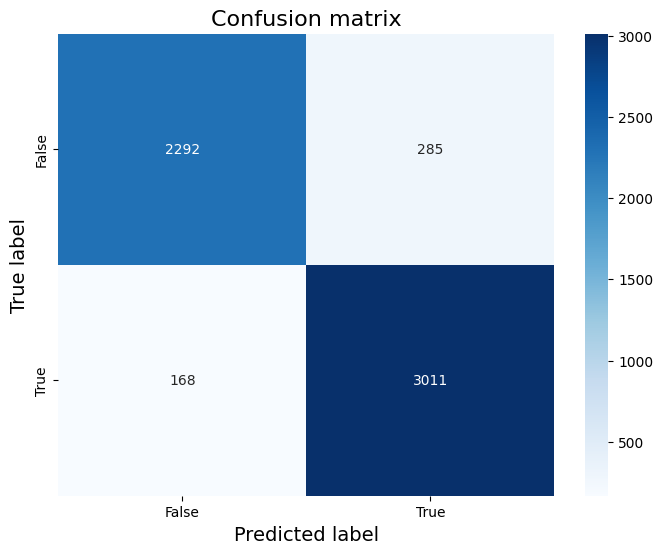

In [ ]:
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["False", "True"], yticklabels=["False", "True"])
plt.title("Confusion matrix", fontsize=16)
plt.xlabel("Predicted label", fontsize=14)
plt.ylabel("True label", fontsize=14)
plt.show()

The confusion matrix shows that the model correctly predicted 2292 false labels out of 2577 and 3011 true labels out of 3179.


In [ ]:
y_val_prob = log_reg.predict_proba(X_val_scaled)[:, 1]
roc_auc = roc_auc_score(y_val_scaled, y_val_prob)

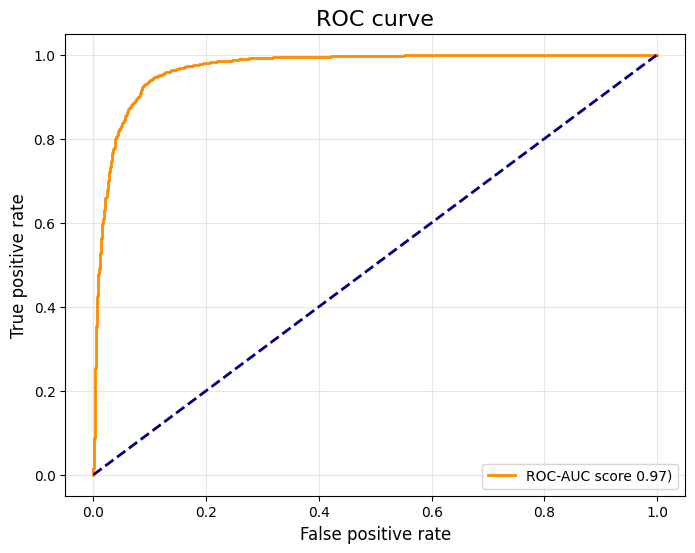

In [ ]:
fpr, tpr, thresholds = roc_curve(y_val_scaled, y_val_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC-AUC score {roc_auc:.2f})", color="darkorange", lw=2)
plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
plt.xlabel("False positive rate", fontsize=12)
plt.ylabel("True positive rate", fontsize=12)
plt.title("ROC curve", fontsize=16)
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.show()

ROC-AUC score 0.97 shows that the model is very capable of distinguishing between the false and true classes.

In [ ]:
feature_importance = pd.DataFrame({
    'Features': filtered_features_columns,
    'Coefficients': log_reg.coef_[0]
}).sort_values(by='Coefficients', ascending=False)

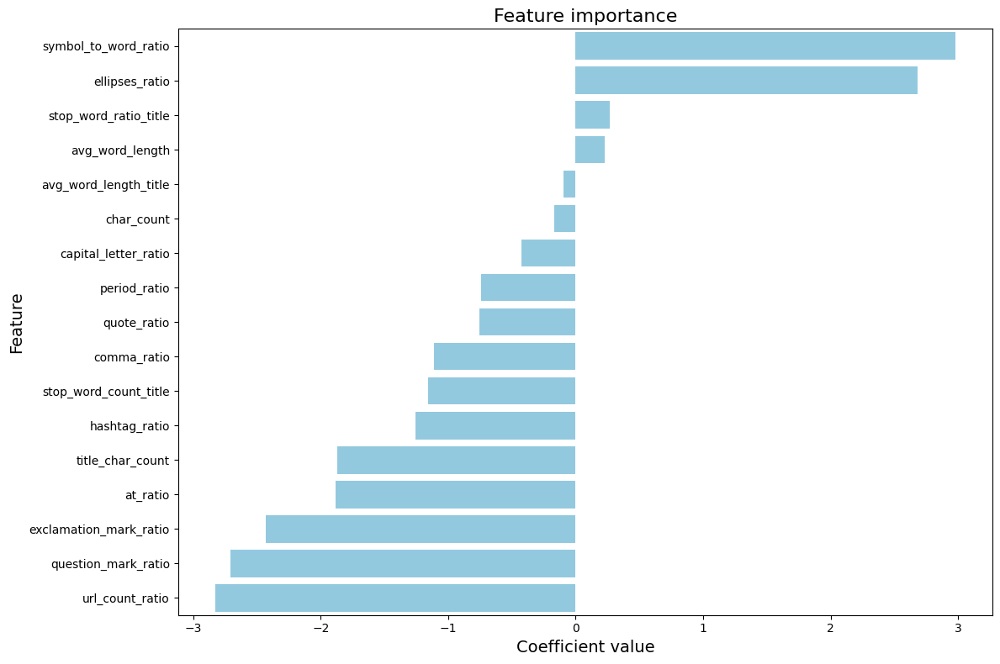

In [ ]:
plt.figure(figsize=(12, 8))
sns.barplot(data=feature_importance, x='Coefficients', y='Features', color="skyblue", orient='h')
plt.title("Feature importance", fontsize=16)
plt.xlabel("Coefficient value", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.tight_layout()
plt.show()

Symbol to word ratio and ellipses ratio are the 2 top positive contributors to the predictions of true articles. Features like stop word ratio of title and average word length also positively contribute.Negative coefficients like URL count ratio and question mark ratio shows these features are more indicative of false articles.

**RFE**

To find the most impactful features for classification we used recursive feature elimination method using logistic regression. It iteratively removes least important features based on the coefficients, this simplifies feature space but could maintain performance. We will leave 12 features and will see how it changes the performance.

In [ ]:
log_reg_rfe = LogisticRegression(max_iter=1000, random_state=42)

In [ ]:
rfe = RFE(estimator=log_reg_rfe, n_features_to_select=12, step=1)

In [ ]:
rfe.fit(X_train_scaled, y_train_scaled)

RFE(estimator=LogisticRegression(max_iter=1000, random_state=42),
    n_features_to_select=12)

In [ ]:
rfe_ranking = pd.DataFrame({
    'Feature': filtered_features_columns,
    'Rankings': rfe.ranking_
}).sort_values(by='Rankings')

In [ ]:
selected_features = rfe_ranking[rfe_ranking['Rankings'] == 1]['Feature'].tolist()
print(f"Selected features: {selected_features}")

Selected features: ['title_char_count', 'question_mark_ratio', 'exclamation_mark_ratio', 'ellipses_ratio', 'comma_ratio', 'url_count_ratio', 'period_ratio', 'symbol_to_word_ratio', 'stop_word_count_title', 'quote_ratio', 'at_ratio', 'hashtag_ratio']


In [ ]:
X_train_rfe = rfe.transform(X_train_scaled)
X_val_rfe = rfe.transform(X_val_scaled)
X_test_rfe = rfe.transform(X_test_scaled)

In [ ]:
log_reg_rfe.fit(X_train_rfe, y_train_scaled)

LogisticRegression(max_iter=1000, random_state=42)

In [ ]:
y_val_pred_rfe = log_reg_rfe.predict(X_val_rfe)

In [ ]:
print(classification_report(y_val_scaled, y_val_pred_rfe))

              precision    recall  f1-score   support

           0       0.93      0.88      0.91      2577
           1       0.91      0.95      0.93      3179

    accuracy                           0.92      5756
   macro avg       0.92      0.91      0.92      5756
weighted avg       0.92      0.92      0.92      5756



Performance seems to be remaining the same.

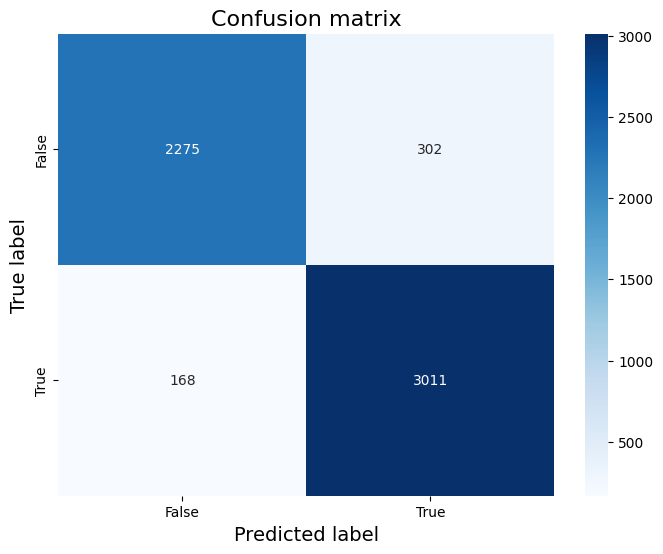

In [ ]:
conf_matrix_rfe = confusion_matrix(y_val_scaled, y_val_pred_rfe)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_rfe, annot=True, fmt="d", cmap="Blues", xticklabels=["False", "True"], yticklabels=["False", "True"])
plt.title("Confusion matrix", fontsize=16)
plt.xlabel("Predicted label", fontsize=14)
plt.ylabel("True label", fontsize=14)
plt.show()

True text missclassification remains the same however 17 false text more were identifies as true compared to the 16 features models:

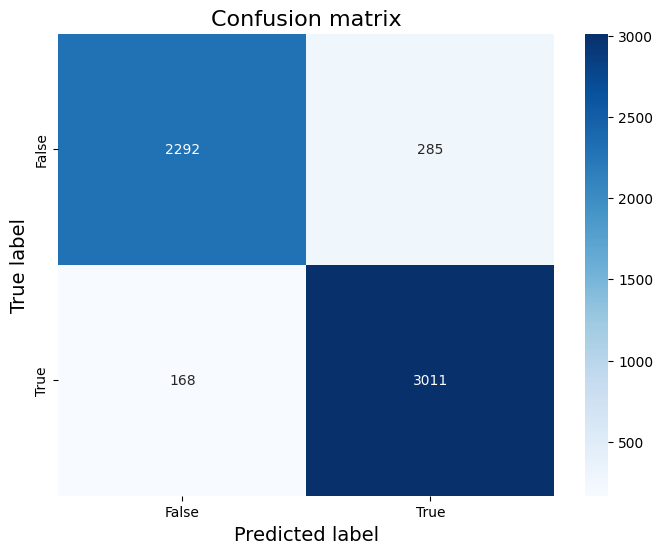

In [ ]:
y_val_prob_rfe = log_reg_rfe.predict_proba(X_val_rfe)[:, 1]
roc_auc_rfe = roc_auc_score(y_val_scaled, y_val_prob_rfe)

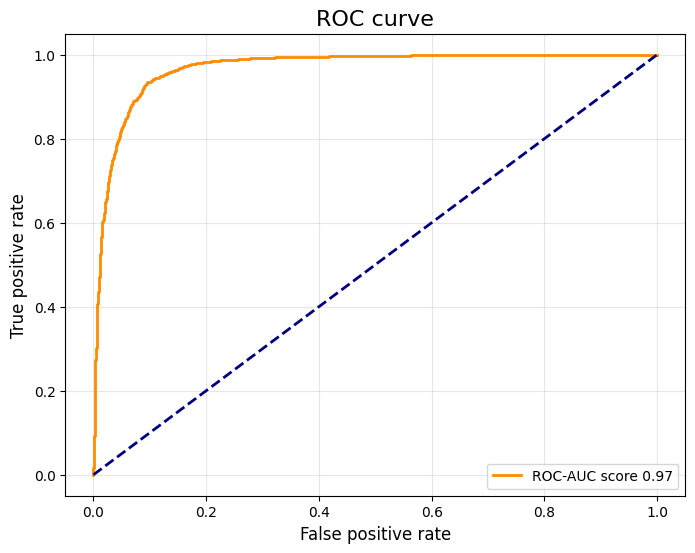

In [ ]:
fpr_rfe, tpr_rfe, thresholds_rfe = roc_curve(y_val_scaled, y_val_prob_rfe)
plt.figure(figsize=(8, 6))
plt.plot(fpr_rfe, tpr_rfe, label=f"ROC-AUC score {roc_auc_rfe:.2f}", color="darkorange", lw=2)
plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
plt.xlabel("False positive rate", fontsize=12)
plt.ylabel("True positive rate", fontsize=12)
plt.title("ROC curve", fontsize=16)
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.show()

ROC-AUC shows the same results as before.

In [ ]:
feature_importance_rfe = pd.DataFrame({
    'Feature': selected_features,
    'Coefficient': log_reg_rfe.coef_[0]
}).sort_values(by='Coefficient', ascending=False)

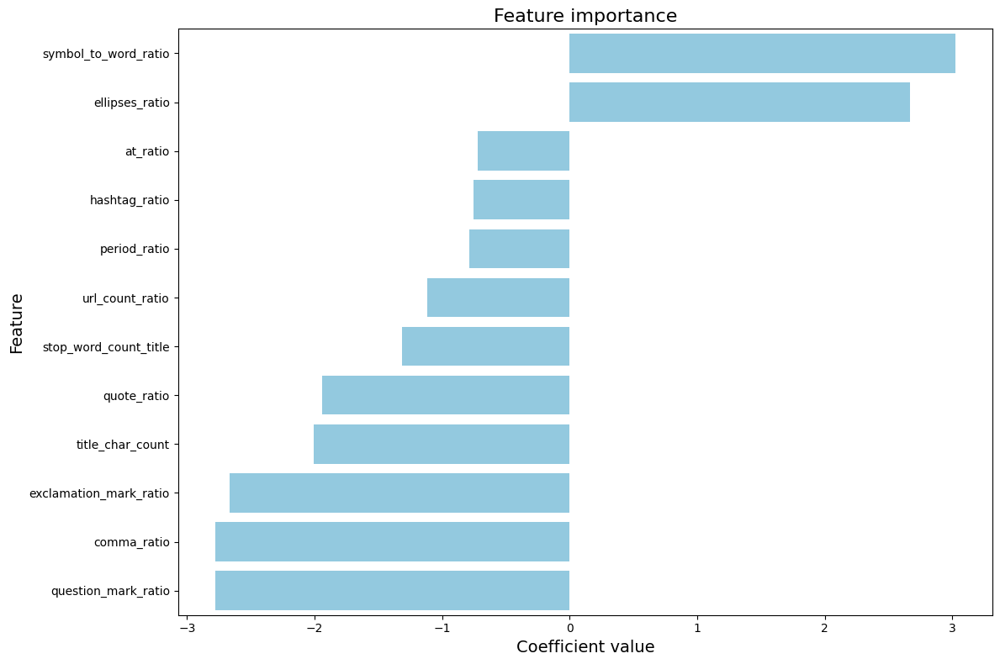

In [ ]:
plt.figure(figsize=(12, 8))
sns.barplot(data=feature_importance_rfe, x='Coefficient', y='Feature', color="skyblue", orient='h')
plt.title("Feature importance", fontsize=16)
plt.xlabel("Coefficient value", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.tight_layout()
plt.show()

Symbol to word ratio and ellipses ratio remained the most positively effecting features.

Interestingly features like question mark ratio and comma ratio have higher negative impact compared to the features impact from previous model where url count ration was most siginificant:

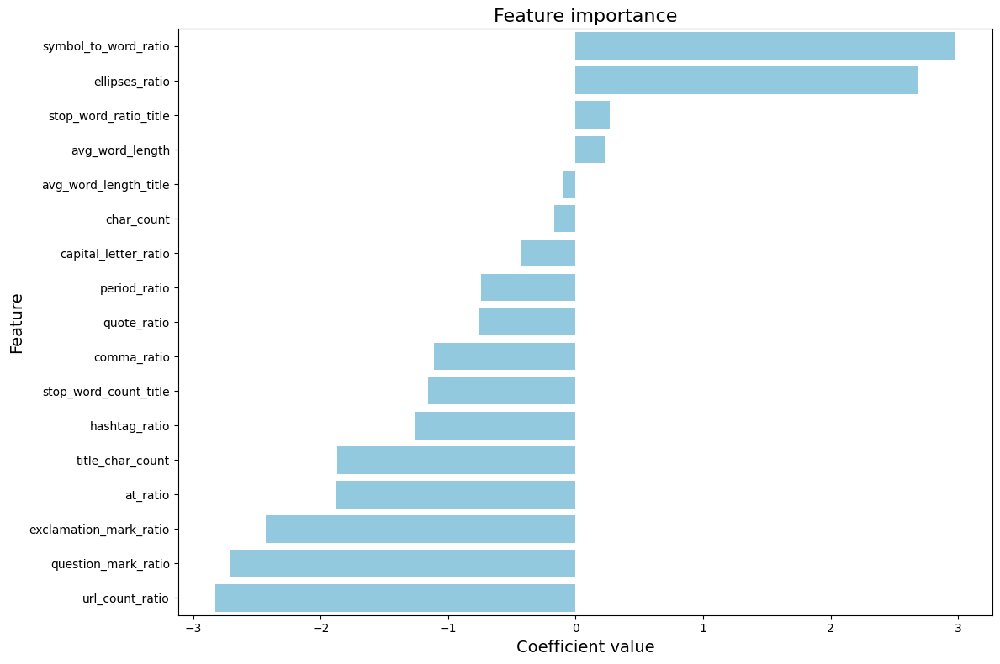

####  Adding class weights

 We incorporated class weights into the logistic regression model with class_weight=balanced making weights inversely proportional to class proportions.

In [ ]:
log_reg_weighted = LogisticRegression(max_iter=1000, random_state=42, class_weight='balanced')

In [ ]:
log_reg_weighted.fit(X_train_rfe, y_train_scaled)

LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)

In [ ]:
y_val_pred_weighted = log_reg_weighted.predict(X_val_rfe)

In [ ]:
print(classification_report(y_val_scaled, y_val_pred_weighted))

              precision    recall  f1-score   support

           0       0.92      0.90      0.91      2577
           1       0.92      0.94      0.93      3179

    accuracy                           0.92      5756
   macro avg       0.92      0.92      0.92      5756
weighted avg       0.92      0.92      0.92      5756



General results are remaining the same with accurcy and f1 score 92%. However we can see that now both classes precission is equal to one another compared to the models performance before:



```
precision    recall  f1-score   support

           0       0.93      0.88      0.91      2577
           1       0.91      0.95      0.93      3179

    accuracy                           0.92      5756
   macro avg       0.92      0.91      0.92      5756
weighted avg       0.92      0.92      0.92      5756
```



In [ ]:
y_val_prob_weighted = log_reg_weighted.predict_proba(X_val_rfe)[:, 1]
roc_auc_weighted = roc_auc_score(y_val_scaled, y_val_prob_weighted)

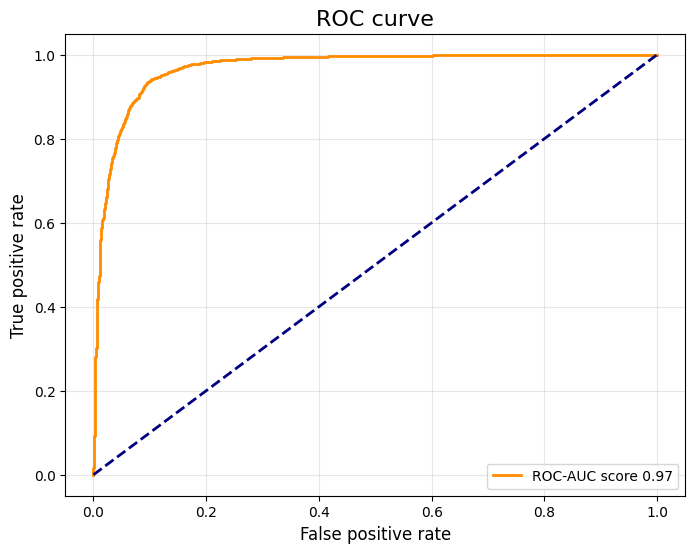

In [ ]:
fpr_weighted, tpr_weighted, thresholds_weighted = roc_curve(y_val_scaled, y_val_prob_weighted)
plt.figure(figsize=(8, 6))
plt.plot(fpr_weighted, tpr_weighted, label=f"ROC-AUC score {roc_auc_weighted:.2f}", color="darkorange", lw=2)
plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
plt.xlabel("False positive rate", fontsize=12)
plt.ylabel("True positive rate", fontsize=12)
plt.title("ROC curve", fontsize=16)
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.show()

In [ ]:
feature_importance_weighted = pd.DataFrame({
    'Feature': selected_features,
    'Coefficient': log_reg_weighted.coef_[0]
}).sort_values(by='Coefficient', ascending=False)


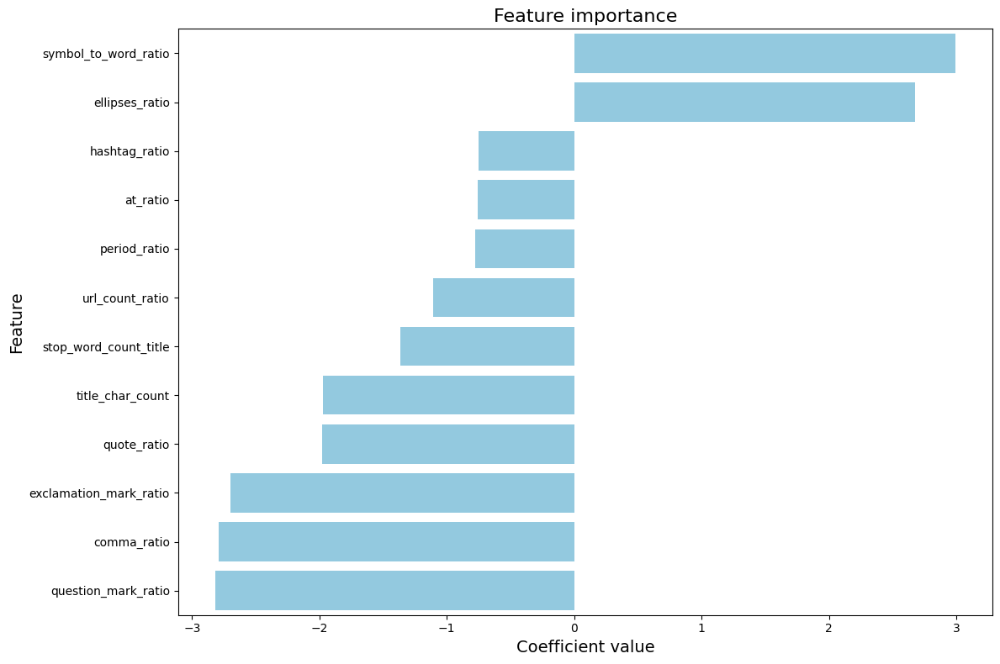

In [ ]:
plt.figure(figsize=(12, 8))
sns.barplot(data=feature_importance_weighted, x='Coefficient', y='Feature', color="skyblue", orient='h')
plt.title("Feature importance", fontsize=16)
plt.xlabel("Coefficient value", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.tight_layout()
plt.show()

Neither ROC-AUC nor feature importance show any differences.

Since the hyperparameters were selected randomly before the results may not be improving due to our poor selection. We will use optuna for hyperparameter tuning.

In [ ]:
def objective(trial):
    penalty = trial.suggest_categorical("penalty", ["l1", "l2"])
    C = trial.suggest_loguniform("C", 1e-4, 1e4)
    class_weight = trial.suggest_categorical("class_weight", [None, "balanced"])

    model = LogisticRegression(
        max_iter=1000,
        random_state=42,
        penalty=penalty,
        solver="liblinear" if penalty == "l1" else "lbfgs",
        C=C,
        class_weight=class_weight,
    )

    scores = cross_val_score(model, X_train_rfe, y_train_scaled, cv=5, scoring="roc_auc")

    return scores.mean()

In [ ]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=30, n_jobs=-1)

print("Best hyperparameters:", study.best_params)
print("Best score:", study.best_value)

Best hyperparameters: {'penalty': 'l2', 'C': 6195.755952951116, 'class_weight': 'balanced'}
Best score: 0.9717695093293999

In [ ]:
best_params = study.best_params

In [ ]:
best_log_model = LogisticRegression(
    max_iter=1000,
    random_state=42,
    penalty=best_params["penalty"],
    solver="liblinear" if best_params["penalty"] == "l1" else "lbfgs",
    C=best_params["C"],
    class_weight=best_params["class_weight"],
)

In [ ]:
best_log_model.fit(X_train_rfe, y_train_scaled)

LogisticRegression(C=6195.755952951116, class_weight='balanced', max_iter=1000,
                   random_state=42)

In [ ]:
y_val_pred_best = best_log_model.predict(X_val_rfe)

In [ ]:
print(classification_report(y_val_scaled, y_val_pred_best))

              precision    recall  f1-score   support

           0       0.92      0.90      0.91      2577
           1       0.92      0.94      0.93      3179

    accuracy                           0.92      5756
   macro avg       0.92      0.92      0.92      5756
weighted avg       0.92      0.92      0.92      5756



Results are identical.

In [ ]:
conf_matrix_best = confusion_matrix(y_val_scaled, y_val_pred_best)

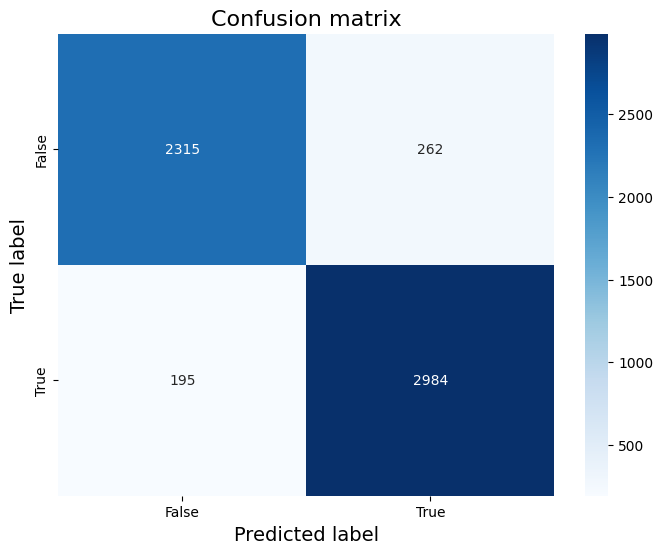

In [ ]:
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_best, annot=True, fmt="d", cmap="Blues", xticklabels=["False", "True"], yticklabels=["False", "True"])
plt.title("Confusion matrix", fontsize=16)
plt.xlabel("Predicted label", fontsize=14)
plt.ylabel("True label", fontsize=14)
plt.show()

In [ ]:
y_val_prob_best = best_log_model.predict_proba(X_val_rfe)[:, 1]
roc_auc_best = roc_auc_score(y_val_scaled, y_val_prob_best)

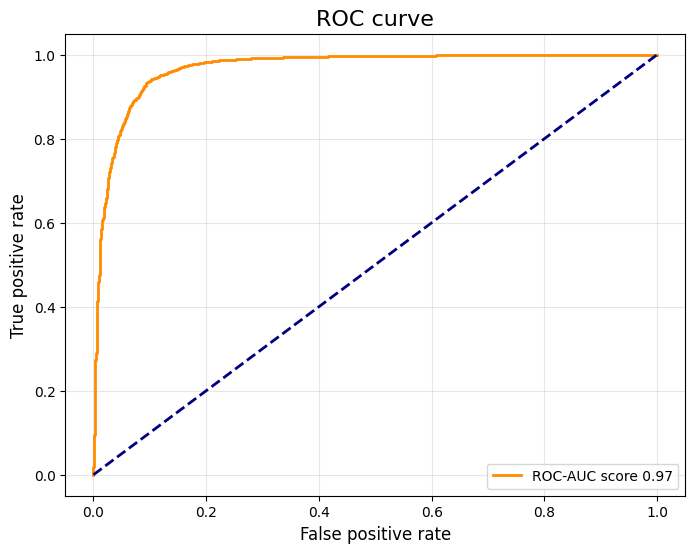

In [ ]:
fpr_best, tpr_best, thresholds_best = roc_curve(y_val_scaled, y_val_prob_best)
plt.figure(figsize=(8, 6))
plt.plot(fpr_best, tpr_best, label=f"ROC-AUC score {roc_auc_best:.2f}", color="darkorange", lw=2)
plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
plt.xlabel("False positive rate", fontsize=12)
plt.ylabel("True positive rate", fontsize=12)
plt.title("ROC curve", fontsize=16)
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.show()

In [ ]:
feature_importance_best = pd.DataFrame({
    'Feature': selected_features,
    'Coefficient': best_log_model.coef_[0]
}).sort_values(by='Coefficient', ascending=False)

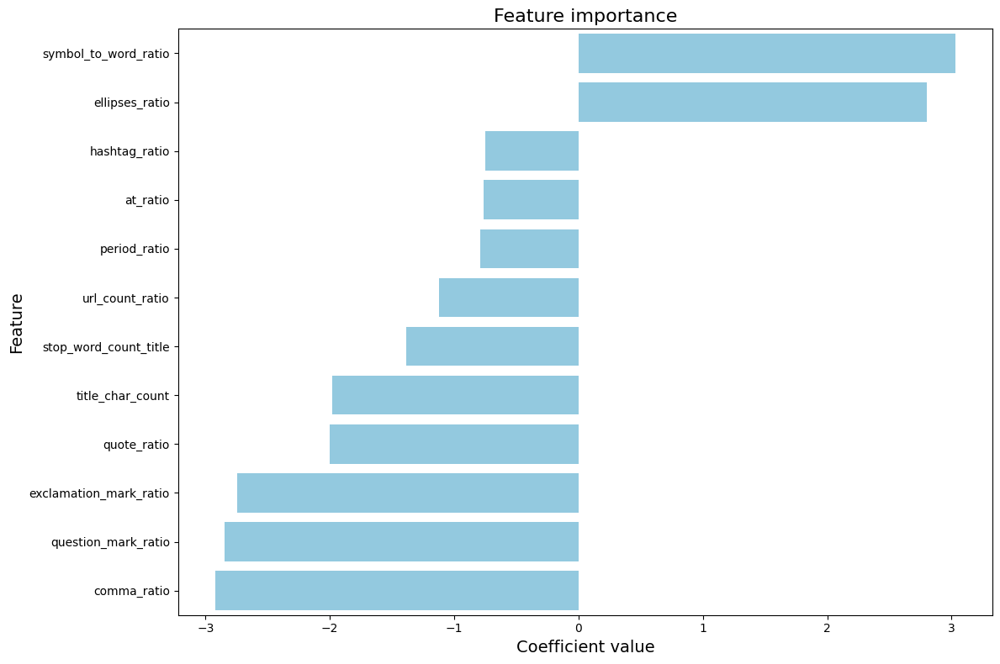

In [ ]:
plt.figure(figsize=(12, 8))
sns.barplot(data=feature_importance_best, x='Coefficient', y='Feature', color="skyblue", orient='h')
plt.title("Feature importance", fontsize=16)
plt.xlabel("Coefficient value", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.tight_layout()
plt.show()

Results remained the same after hyperparameters tuning.

In this part we will use TF-IDF embeddings to represent the masked entity training data and evaluate its performance using logistic regression on the unmasked validation set that we have created during clusttering excersise. We are combining processed text and titles which are masked into a one input. For TF-IDF we will use 500 features.

In [ ]:
train_df_masked['combined'] = train_df_masked['processed_text'] + " " + train_df_masked['processed_title']
val_df_masked['combined'] = val_df_masked['processed_text'] + " " + val_df_masked['processed_title']

In [ ]:
test_df_masked['combined'] = test_df_masked['processed_text'] + " " + test_df_masked['processed_title']

In [ ]:
tfidf_vectorizer = TfidfVectorizer(max_features=500)

In [ ]:
X_train_tf = tfidf_vectorizer.fit_transform(train_df_masked['combined'])
X_val_tf = tfidf_vectorizer.transform(val_df_masked['combined'])

In [ ]:
X_test_tf = tfidf_vectorizer.transform(test_df_masked['combined'])

In [ ]:
y_train_tf = train_df_masked['label'].replace({"True": 1, "False": 0}).values
y_val_tf = val_df_masked['label'].replace({"True": 1, "False": 0}).values

In [ ]:
y_test_tf = test_df_masked['label'].replace({"True": 1, "False": 0}).values

In [ ]:
logistic_model_tf = LogisticRegression(penalty='l2', C=1.0, solver='liblinear', class_weight='balanced', random_state=42)

In [ ]:
logistic_model_tf.fit(X_train_tf, y_train_tf)

LogisticRegression(class_weight='balanced', random_state=42, solver='liblinear')

In [ ]:
y_val_pred = logistic_model_tf.predict(X_val_tf)
y_val_prob = logistic_model_tf.predict_proba(X_val_tf)[:, 1]

In [ ]:
print("Validation performance:")
print(classification_report(y_val_tf, y_val_pred))

Validation performance:
              precision    recall  f1-score   support

           0       0.93      0.98      0.95      2577
           1       0.98      0.94      0.96      3179

    accuracy                           0.96      5756
   macro avg       0.96      0.96      0.96      5756
weighted avg       0.96      0.96      0.96      5756



The logistic regression model using TF-IDF scores achieved better results compared to the engineered features model with 96% accuracy and F1 score. However despite the masking of entities model might overly rely on specific words. This could limit its generalizability and effectiveness in real life scenarios involving text that differs from political news.

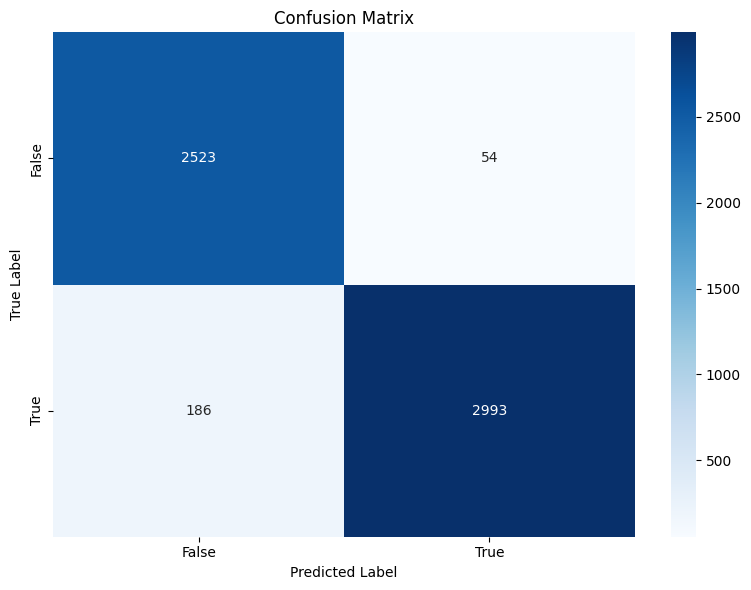

In [ ]:
conf_matrix = confusion_matrix(y_val_tf, y_val_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["False", "True"], yticklabels=["False", "True"])
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()

The model correctly identifies a large proportion of both labels. Most errors are concentrated in true labels.

In [ ]:
fpr, tpr, thresholds = roc_curve(y_val_tf, y_val_prob)
roc_auc = roc_auc_score(y_val_tf, y_val_prob)

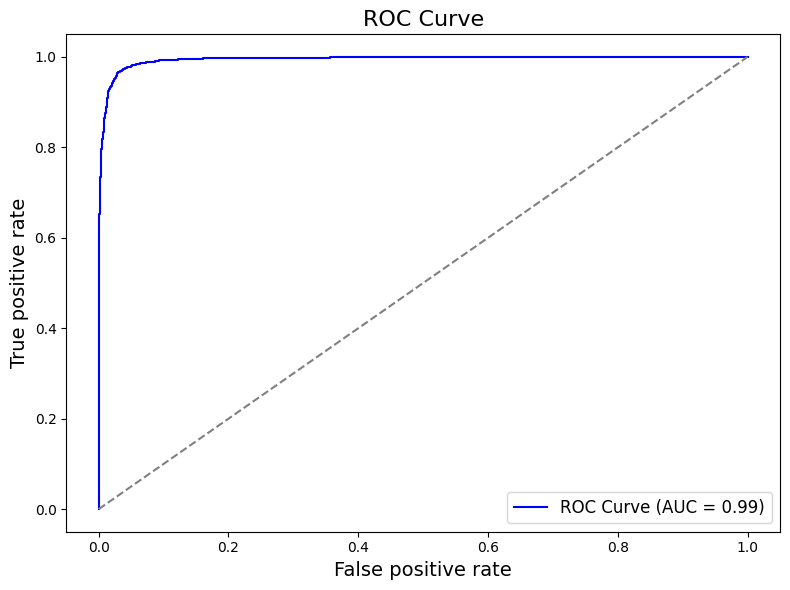

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.2f})", color="blue")
plt.plot([0, 1], [0, 1], color="gray", linestyle="--")
plt.title("ROC Curve", fontsize=16)
plt.xlabel("False positive rate", fontsize=14)
plt.ylabel("True positive rate", fontsize=14)
plt.legend(loc="lower right", fontsize=12)
plt.tight_layout()
plt.show()

The model achieves 0.99 ROC-AUC score.

In [ ]:
feature_importance = pd.DataFrame({
    'Feature': tfidf_vectorizer.get_feature_names_out(),
    'Coefficient': logistic_model_tf.coef_[0]
}).sort_values(by='Coefficient', ascending=False)

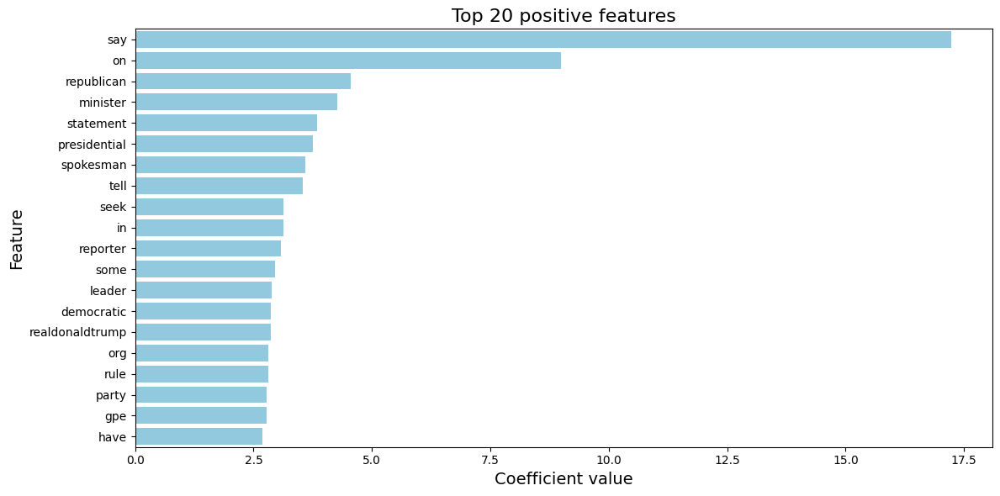

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(data=feature_importance.head(20), x='Coefficient', y='Feature', color="skyblue", orient='h')
plt.title("Top 20 positive features", fontsize=16)
plt.xlabel("Coefficient value", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.tight_layout()
plt.show()

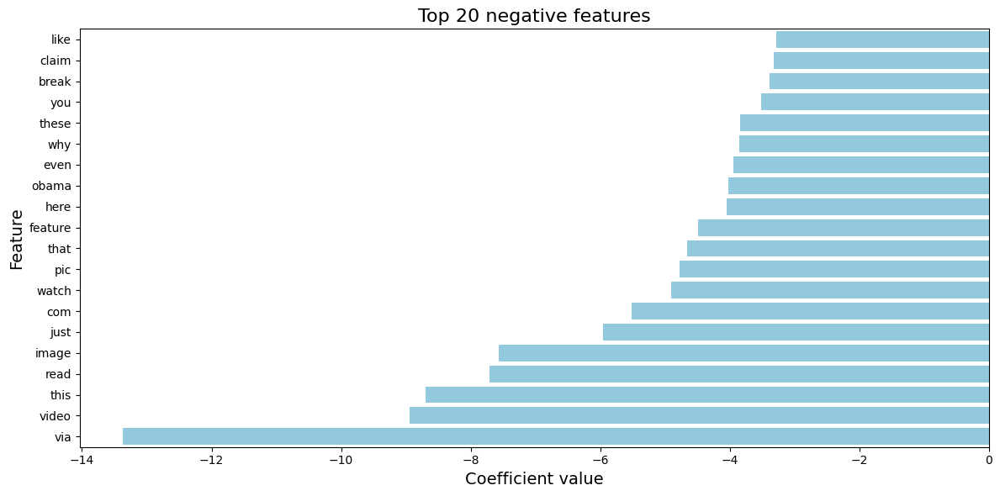

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(data=feature_importance.tail(20), x='Coefficient', y='Feature', color="skyblue", orient='h')
plt.title("Top 20 negative features", fontsize=16)
plt.xlabel("Coefficient value", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.tight_layout()
plt.show()

Words like say, on, republican and minister have highest positive coefficients showing strong association with the true articles. Words like via, video, read and image shows strongest association with false texts.


#### Random forest

To explore more engineered features as they could be less biases than tf-idf model we will try to use random forest classifier.

In [ ]:
engineered_features = [
    'char_count', 'word_count', 'unique_word_count', 'avg_word_length', 'sentence_count',
    'symbol_to_word_ratio', 'capital_letter_ratio', 'special_char_ratio', 'comma_ratio',
    'period_ratio', 'question_mark_ratio', 'exclamation_mark_ratio', 'ellipses_ratio',
    'url_count_ratio', 'hashtag_ratio', 'at_ratio', 'quote_ratio', 'title_char_count',
    'title_word_count', 'title_unique_word_count', 'avg_word_length_title',
    'stop_word_count_title', 'stop_word_ratio_title'
]

In [ ]:
X_train = train_df[engineered_features].fillna(0).values
y_train = train_df['numeric_label'].values

In [ ]:
X_val = val_df[engineered_features].fillna(0).values
y_val = val_df['numeric_label'].values

In [ ]:
X_test = test_df[engineered_features].fillna(0).values
y_test = test_df['numeric_label'].values

In [ ]:
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")

X_train shape: (26860, 23), y_train shape: (26860,)
X_val shape: (5756, 23), y_val shape: (5756,)
X_test shape: (5756, 23), y_test shape: (5756,)


In [ ]:
def random_forest_objective(trial):
    n_estimators = trial.suggest_int("n_estimators", 50, 100)
    max_depth = trial.suggest_int("max_depth", 10, 50)
    min_samples_split = trial.suggest_int("min_samples_split", 2, 10)
    min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 10)
    max_features = trial.suggest_categorical("max_features", ["sqrt", "log2", None])

    rf_model = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        max_features=max_features,
        random_state=42,
        class_weight="balanced"
    )

    scores = cross_val_score(rf_model, X_train, y_train, cv=5, scoring="roc_auc")
    return scores.mean()

In [ ]:
rf_study = optuna.create_study(direction="maximize")
rf_study.optimize(random_forest_objective, n_trials=10, n_jobs=-1)

[I 2024-12-22 00:05:59,485] A new study created in memory with name: no-name-30a688de-baab-4e13-bf85-d31987b72e96
[I 2024-12-22 00:06:20,938] Trial 9 finished with value: 0.9810706451499257 and parameters: {'n_estimators': 53, 'max_depth': 27, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 'log2'}. Best is trial 9 with value: 0.9810706451499257.
[I 2024-12-22 00:06:21,461] Trial 1 finished with value: 0.9791350103386336 and parameters: {'n_estimators': 69, 'max_depth': 13, 'min_samples_split': 8, 'min_samples_leaf': 10, 'max_features': 'sqrt'}. Best is trial 9 with value: 0.9810706451499257.
[I 2024-12-22 00:06:25,708] Trial 7 finished with value: 0.9801793690476137 and parameters: {'n_estimators': 71, 'max_depth': 19, 'min_samples_split': 7, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 9 with value: 0.9810706451499257.
[I 2024-12-22 00:06:33,743] Trial 4 finished with value: 0.9815584070928104 and parameters: {'n_estimators': 97, 'max_depth': 29, 'min_

In [ ]:
best_params = rf_study.best_params
print("Best hyperparameters:", best_params)

Best hyperparameters: {'n_estimators': 97, 'max_depth': 29, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 'log2'}


In [ ]:
best_rf_model = RandomForestClassifier(
    n_estimators=best_params["n_estimators"],
    max_depth=best_params["max_depth"],
    min_samples_split=best_params["min_samples_split"],
    min_samples_leaf=best_params["min_samples_leaf"],
    max_features=best_params["max_features"],
    random_state=42,
    class_weight="balanced"
)

In [ ]:
best_rf_model.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=29,
                       max_features='log2', min_samples_leaf=3,
                       min_samples_split=7, n_estimators=97, random_state=42)

In [ ]:
y_val_pred = best_rf_model.predict(X_val)
y_val_prob = best_rf_model.predict_proba(X_val)[:, 1]

In [ ]:
print(classification_report(y_val, y_val_pred))

              precision    recall  f1-score   support

           0       0.93      0.92      0.93      2577
           1       0.94      0.95      0.94      3179

    accuracy                           0.94      5756
   macro avg       0.93      0.93      0.93      5756
weighted avg       0.94      0.94      0.93      5756



Random Forest achieved an accuracy and f1 score of 93% which is slightly better than the logistic regression of 92%.

In [ ]:
conf_matrix = confusion_matrix(y_val, y_val_pred)

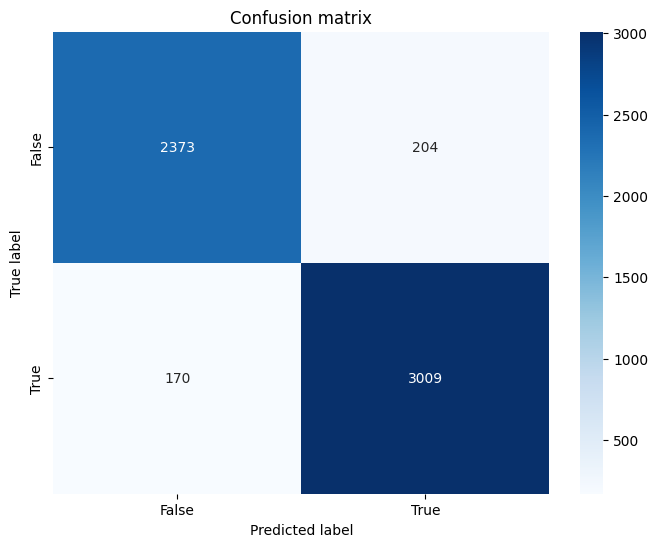

In [ ]:
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["False", "True"], yticklabels=["False", "True"])
plt.title("Confusion matrix")
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.show()

Confusion matrix also shows less missclassification compared to the logistic regression based on engineered features.

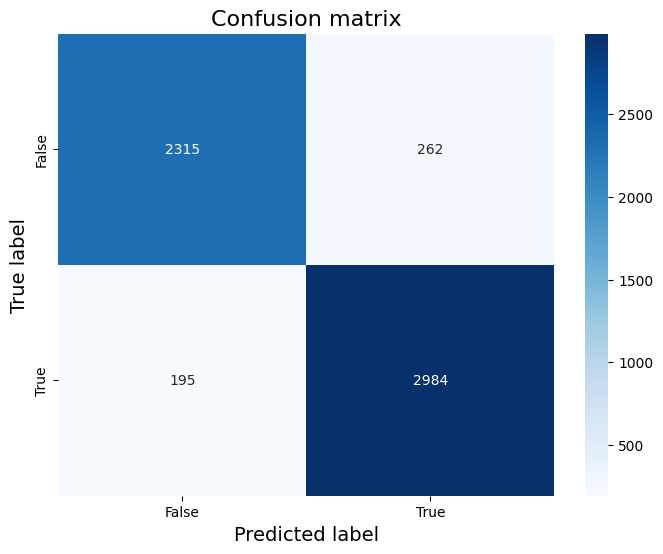

In [ ]:
roc_auc_val = roc_auc_score(y_val, y_val_prob)
fpr, tpr, thresholds = roc_curve(y_val, y_val_prob)

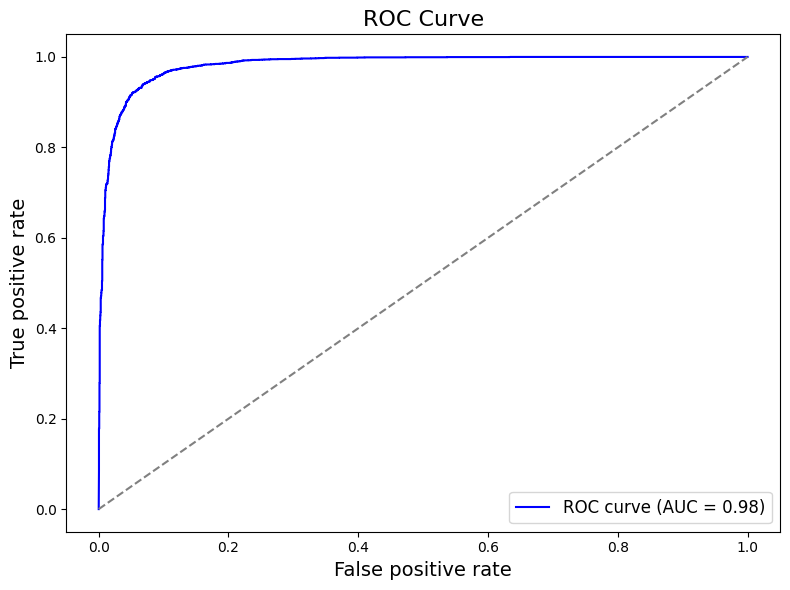

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC curve (AUC = {roc_auc_val:.2f})", color="blue")
plt.plot([0, 1], [0, 1], color="gray", linestyle="--")
plt.title("ROC Curve", fontsize=16)
plt.xlabel("False positive rate", fontsize=14)
plt.ylabel("True positive rate", fontsize=14)
plt.legend(loc="lower right", fontsize=12)
plt.tight_layout()
plt.show()

Slitghly better ROC-AUC score shows better predictive performance as well.

In [ ]:
feature_importances = best_rf_model.feature_importances_

In [ ]:
importance_df = pd.DataFrame({
    'Feature': engineered_features,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

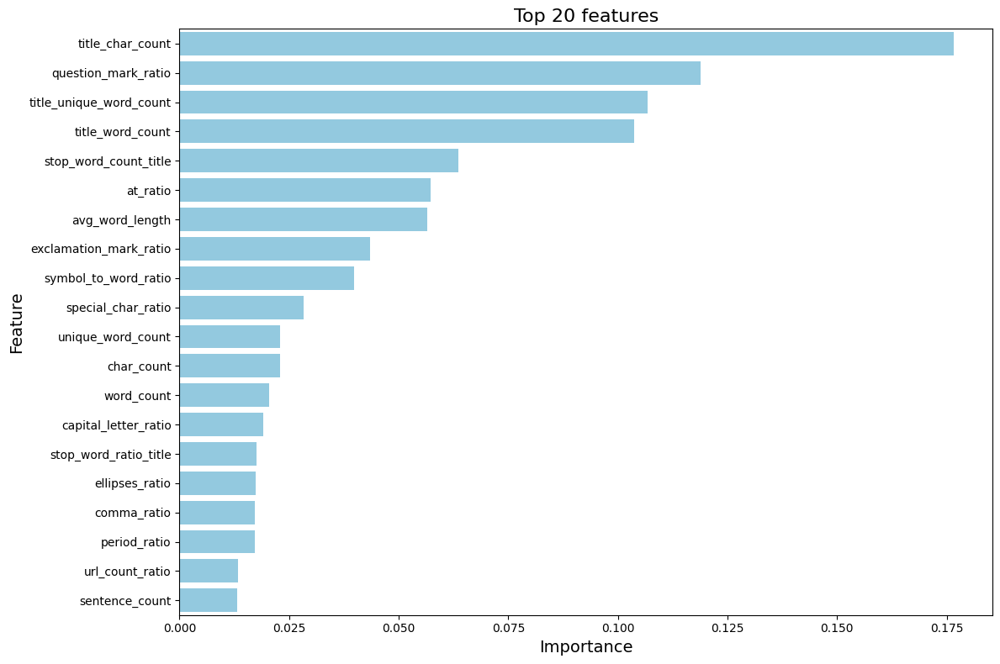

In [ ]:
plt.figure(figsize=(12, 8))
sns.barplot(data=importance_df.head(20), x='Importance', y='Feature', color="skyblue", orient='h')
plt.title("Top 20 features", fontsize=16)
plt.xlabel("Importance", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.tight_layout()
plt.show()

Features that are important in the random forest model are different than logstic regression we can see that most disitnguishing features include title char count, question mark ratio and title unique word count. Title features seem to be playing most important role in this model.

Lets have a look at one of the trees.

In [ ]:
single_tree = best_rf_model.estimators_[0]

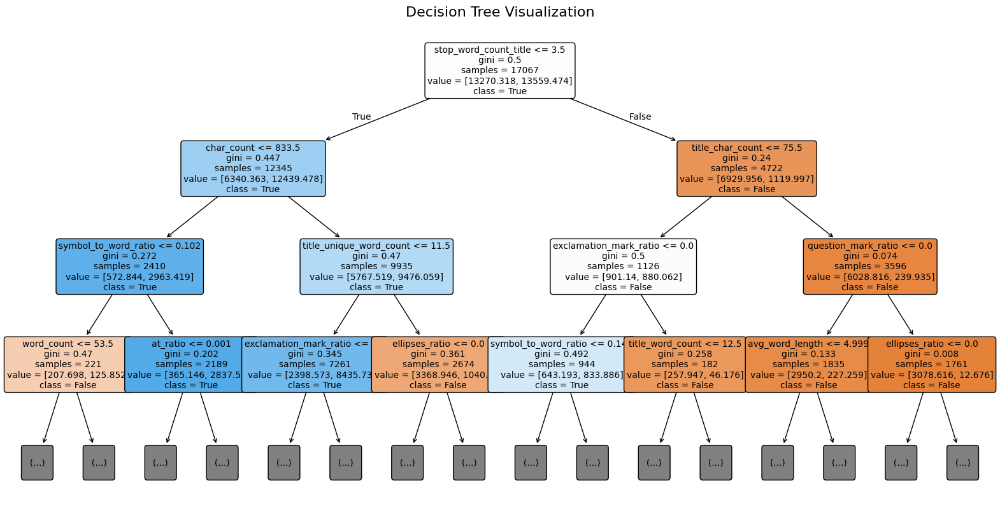

In [ ]:
plt.figure(figsize=(20, 10))
plot_tree(
    single_tree,
    feature_names=engineered_features,
    class_names=["False", "True"],
    filled=True,
    rounded=True,
    max_depth=3,
    fontsize=10
)
plt.title("Decision Tree Visualization", fontsize=16)
plt.show()

This decision tree begins splitting with the feature the number of stop words in title. This indicates that the model prioritizes this feature as a an important factor for distinguishing between the classes.

Finally we will use our entity masked data to train DistilBERT tranformer model for labels classification.

As of starting point we will select some random hyperparameters to see if model even is suitable and how it performes with the data. We will start with batch size of 32, max length of tokens 100 and learning rate 0.0001. We will be training only the added output layer, doing only feature extraction. If necessary we will consider training more layers.

In [ ]:
train_df_masked["label"] = train_df_masked["label"].astype(int)
val_df_masked["label"] = val_df_masked["label"].astype(int)

In [ ]:
test_df_masked["label"] = test_df_masked["label"].astype(int)

In [ ]:
class TextDataset(Dataset):
    def __init__(self, dataframe, tokenizer, max_length):
        self.dataframe = dataframe
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        text = self.dataframe.iloc[idx]["processed_text"]
        label = self.dataframe.iloc[idx]["label"]
        encoding = self.tokenizer(
            text,
            max_length=self.max_length,
            padding="max_length",
            truncation=True,
            return_tensors="pt",
        )
        return {
            "input_ids": encoding["input_ids"].squeeze(0),
            "attention_mask": encoding["attention_mask"].squeeze(0),
            "label": torch.tensor(label, dtype=torch.long),
        }

In [ ]:
class TextDataModule(pl.LightningDataModule):
    def __init__(self, train_df, val_df, tokenizer, max_length, batch_size):
        super().__init__()
        self.train_df = train_df
        self.val_df = val_df
        self.tokenizer = tokenizer
        self.max_length = max_length
        self.batch_size = batch_size

    def setup(self, stage=None):
        self.train_dataset = TextDataset(self.train_df, self.tokenizer, self.max_length)
        self.val_dataset = TextDataset(self.val_df, self.tokenizer, self.max_length)

    def train_dataloader(self):
        return DataLoader(self.train_dataset, batch_size=self.batch_size, shuffle=True)

    def val_dataloader(self):
        return DataLoader(self.val_dataset, batch_size=self.batch_size, shuffle=False)

In [ ]:
class DistilBERTClassifier(pl.LightningModule):
    def __init__(self, model_name, num_labels, learning_rate):
        super(DistilBERTClassifier, self).__init__()
        self.model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=num_labels)
        self.learning_rate = learning_rate
        self.loss_fn = nn.CrossEntropyLoss()

        for param in self.model.distilbert.parameters():
            param.requires_grad = False

    def forward(self, input_ids, attention_mask):
        return self.model(input_ids=input_ids, attention_mask=attention_mask)

    def training_step(self, batch, batch_idx):
        outputs = self(input_ids=batch["input_ids"], attention_mask=batch["attention_mask"])
        logits = outputs.logits
        loss = self.loss_fn(logits, batch["label"])
        preds = torch.argmax(logits, dim=1)
        acc = (preds == batch["label"]).float().mean()

        self.log("train_loss", loss, on_step=False, on_epoch=True, batch_size=len(batch["label"]))
        self.log("train_acc", acc, on_step=False, on_epoch=True, batch_size=len(batch["label"]))
        return loss

    def validation_step(self, batch, batch_idx):
        outputs = self(input_ids=batch["input_ids"], attention_mask=batch["attention_mask"])
        logits = outputs.logits
        val_loss = self.loss_fn(logits, batch["label"])
        preds = torch.argmax(logits, dim=1)
        acc = (preds == batch["label"]).float().mean()

        self.log("val_loss", val_loss, on_step=False, on_epoch=True, batch_size=len(batch["label"]))
        self.log("val_acc", acc, on_step=False, on_epoch=True, batch_size=len(batch["label"]))

    def configure_optimizers(self):
        return AdamW(self.parameters(), lr=self.learning_rate)

In [ ]:
MAX_LENGTH = 100
BATCH_SIZE = 32
LEARNING_RATE = 0.0001
NUM_LABELS = 2
MODEL_NAME = "distilbert-base-uncased"

In [ ]:
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

In [ ]:
train_data = train_df_masked[["processed_text", "label"]].copy()
val_data = train_df_masked[["processed_text", "label"]].copy()

In [ ]:
test_data = test_df_masked[["processed_text", "label"]].copy()

In [ ]:
data_module = TextDataModule(train_df=train_data, val_df=val_data, tokenizer=tokenizer, max_length=MAX_LENGTH, batch_size=BATCH_SIZE)

In [ ]:
model_v1 = DistilBERTClassifier(model_name=MODEL_NAME, num_labels=NUM_LABELS, learning_rate=LEARNING_RATE)

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
csv_logger = CSVLogger(save_dir="logs", name="distilbert_v1_logs")

In [ ]:
early_stopping = pl.callbacks.EarlyStopping(monitor="val_loss", patience=3, mode="min")

In [ ]:
trainer = pl.Trainer(
    max_epochs=10,
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    logger=csv_logger,
    callbacks=[early_stopping],
)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [ ]:
trainer.fit(model_v1, datamodule=data_module)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:591: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type                                | Params | Mode 
------------------------------------------------------------------------
0 | model   | DistilBertForSequenceClassification | 67.0 M | eval 
1 | loss_fn | CrossEntropyLoss                    | 0      | train
------------------------------------------------------------------------
592 K     Trainable params
66.4 M    Non-trainable params
67.0 M    Total params
267.820   Total estimated model params size (MB)
1         Modules in train mode
96        Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [ ]:
def evaluate_on_validation(model, val_loader):
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for batch in val_loader:
            input_ids = batch["input_ids"].to(model.device)
            attention_mask = batch["attention_mask"].to(model.device)
            labels = batch["label"].to(model.device)

            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            logits = outputs.logits
            probs = torch.softmax(logits, dim=1)[:, 1]
            preds = torch.argmax(logits, dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print("Classification Report:")
    print(classification_report(all_labels, all_preds, digits=4))

    conf_mat = confusion_matrix(all_labels, all_preds)
    sns.heatmap(conf_mat, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.ylabel("True Label")
    plt.xlabel("Predicted Label")
    plt.show()

    roc_auc = roc_auc_score(all_labels, all_probs)
    print(f"ROC-AUC: {roc_auc:.4f}")

    RocCurveDisplay.from_predictions(all_labels, all_probs)
    plt.title("ROC Curve")
    plt.show()

In [ ]:
def plot_training_logs(log_csv_path):
    logs = pd.read_csv(log_csv_path)

    train_logs = logs[logs['train_loss'].notna()]
    val_logs = logs[logs['val_loss'].notna()]

    plt.figure(figsize=(10, 5))
    plt.plot(train_logs['epoch'], train_logs['train_acc'], label="Train Accuracy")
    plt.plot(val_logs['epoch'], val_logs['val_acc'], label="Validation Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title("Training and Validation Accuracy")
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(train_logs['epoch'], train_logs['train_loss'], label="Train Loss")
    plt.plot(val_logs['epoch'], val_logs['val_loss'], label="Validation Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss")
    plt.legend()
    plt.show()

In [ ]:
val_dataset = TextDataset(val_data, tokenizer, MAX_LENGTH)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

Classification Report:
              precision    recall  f1-score   support

           0     0.7310    0.9891    0.8407      2577
           1     0.9877    0.7049    0.8227      3179

    accuracy                         0.8322      5756
   macro avg     0.8593    0.8470    0.8317      5756
weighted avg     0.8728    0.8322    0.8308      5756



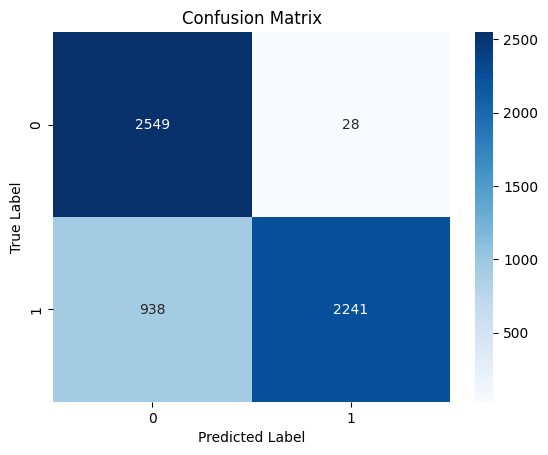

ROC-AUC: 0.9807


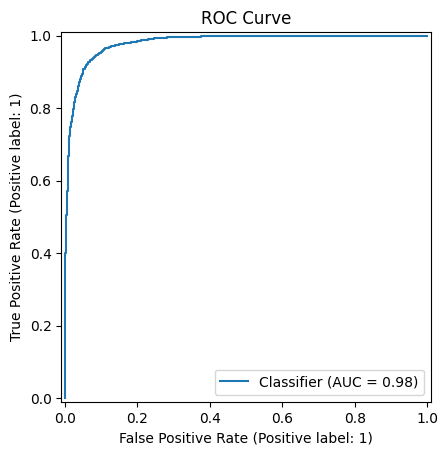

In [ ]:
evaluate_on_validation(model_v1, val_loader)

The overall accuracy and f1 score of the model is 83%, showing it correctly predicts 83.22% of the samples.

Confusion matrix highlights that the model struggles mostly with true text as it made 938 misclassifications compared to 28 misclassification of false texts.

The ROC-AUC curve shows very good performance with score 0.98.

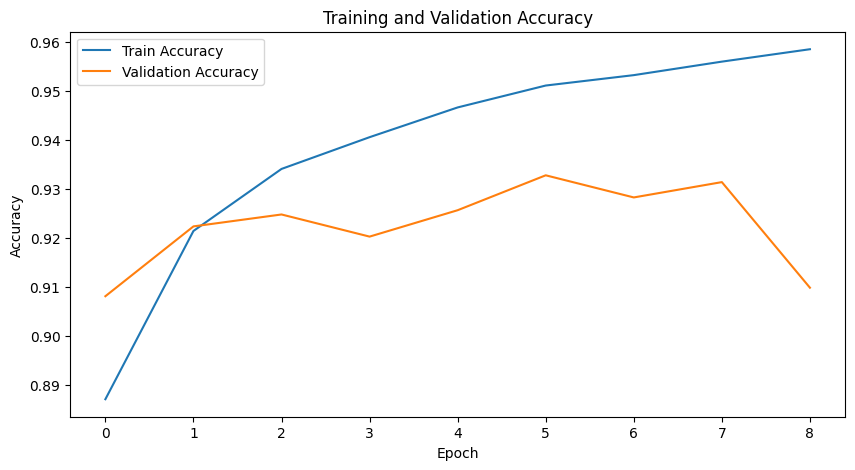

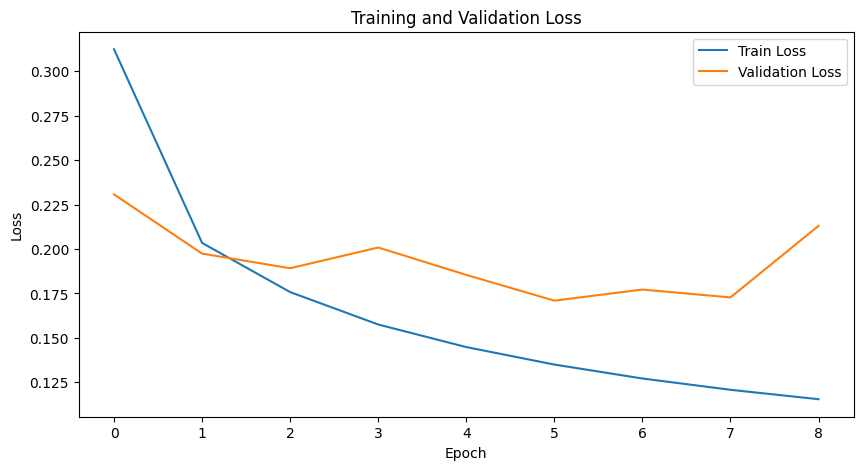

In [ ]:
log_csv_path = "/content/logs/distilbert_v1_logs/version_0/metrics.csv"
plot_training_logs(log_csv_path)

Training accuracy continues to improve suggesting the model learns well from the training set while validations accuracy peaks at the 4th epoch and stop improving indicating potential overfitting. Training loss steadily but validation loss stops improving after the 3rd epoch.

In order to improve our results we will run optuna for hyperparameters tuning.

In [ ]:
class DistilBERTClassifier(pl.LightningModule):
    def __init__(self, model_name, num_labels, learning_rate, dropout_rate, optimizer_name):
        super(DistilBERTClassifier, self).__init__()
        self.model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=num_labels)
        self.learning_rate = learning_rate
        self.dropout_rate = dropout_rate
        self.optimizer_name = optimizer_name
        self.loss_fn = nn.CrossEntropyLoss()

        for param in self.model.distilbert.parameters():
            param.requires_grad = False

        self.dropout = nn.Dropout(self.dropout_rate)

    def forward(self, input_ids, attention_mask):
        outputs = self.model(input_ids=input_ids, attention_mask=attention_mask)
        logits = self.dropout(outputs.logits)
        return logits

    def training_step(self, batch, batch_idx):
        logits = self(input_ids=batch["input_ids"], attention_mask=batch["attention_mask"])
        loss = self.loss_fn(logits, batch["label"])
        preds = torch.argmax(logits, dim=1)
        acc = (preds == batch["label"]).float().mean()

        self.log("train_loss", loss, on_step=False, on_epoch=True, batch_size=len(batch["label"]))
        self.log("train_acc", acc, on_step=False, on_epoch=True, batch_size=len(batch["label"]))
        return loss

    def validation_step(self, batch, batch_idx):
        logits = self(input_ids=batch["input_ids"], attention_mask=batch["attention_mask"])
        val_loss = self.loss_fn(logits, batch["label"])
        preds = torch.argmax(logits, dim=1)
        acc = (preds == batch["label"]).float().mean()

        self.log("val_loss", val_loss, on_step=False, on_epoch=True, batch_size=len(batch["label"]))
        self.log("val_acc", acc, on_step=False, on_epoch=True, batch_size=len(batch["label"]))

    def configure_optimizers(self):
        if self.optimizer_name == "adamw":
            optimizer = AdamW(self.parameters(), lr=self.learning_rate, weight_decay=0.01)
        elif self.optimizer_name == "adam":
            optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        else:
            raise ValueError("Unsupported optimizer. Choose either 'adam' or 'adamw'.")

        scheduler = {
            "scheduler": torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", patience=2, factor=0.5, verbose=True),
            "monitor": "val_loss",
            "interval": "epoch",
            "frequency": 1,
        }

        return [optimizer], [scheduler]

In [ ]:
def create_dataloaders(train_data, val_data, tokenizer, max_length, batch_size):
    train_dataset = TextDataset(train_data, tokenizer, max_length)
    val_dataset = TextDataset(val_data, tokenizer, max_length)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader

In [ ]:
def objective(trial):
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-3)
    batch_size = trial.suggest_categorical("batch_size", [8, 16, 32])
    max_length = trial.suggest_categorical("max_length", [64, 128, 256])
    dropout_rate = trial.suggest_uniform("dropout_rate", 0.1, 0.5)
    optimizer_name = trial.suggest_categorical("optimizer", ["adam", "adamw"])

    model_optuna = DistilBERTClassifier(
        model_name="distilbert-base-uncased",
        num_labels=2,
        learning_rate=learning_rate,
        dropout_rate=dropout_rate,
        optimizer_name=optimizer_name
    )

    tokenizer = AutoTokenizer.from_pretrained("distilbert-base-uncased")

    train_loader, val_loader = create_dataloaders(
        train_data, val_data, tokenizer, max_length=max_length, batch_size=batch_size
    )

    csv_logger = CSVLogger(save_dir="logs", name=f"distilbert_optunas_trials_{trial.number}")

    trainer = pl.Trainer(
        max_epochs=3,
        accelerator="gpu" if torch.cuda.is_available() else "cpu",
        logger=csv_logger,
        enable_progress_bar=True
    )

    trainer.fit(model_optuna, train_loader, val_loader)

    best_val_loss = trainer.callback_metrics["val_loss"].item()
    return best_val_loss

In [ ]:
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=10)

[I 2024-12-20 10:32:08,298] A new study created in memory with name: no-name-adb893d8-8d45-4b77-9b66-f9c13b3cb31b
<ipython-input-66-2cb10ba80e90>:2: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-3)
<ipython-input-66-2cb10ba80e90>:5: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform("dropout_rate", 0.1, 0.5)
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a dow

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.
[I 2024-12-20 10:44:24,511] Trial 0 finished with value: 0.44144490361213684 and parameters: {'learning_rate': 0.0002463878356370912, 'batch_size': 8, 'max_length': 256, 'dropout_rate': 0.16028537112788085, 'optimizer': 'adam'}. Best is trial 0 with value: 0.44144490361213684.
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerator

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.
[I 2024-12-20 10:55:36,478] Trial 1 finished with value: 0.16546903550624847 and parameters: {'learning_rate': 5.760880708042542e-05, 'batch_size': 16, 'max_length': 256, 'dropout_rate': 0.11338180612630798, 'optimizer': 'adamw'}. Best is trial 1 with value: 0.16546903550624847.
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerat

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.
[I 2024-12-20 11:02:19,527] Trial 2 finished with value: 0.25820043683052063 and parameters: {'learning_rate': 3.2831323174097764e-05, 'batch_size': 8, 'max_length': 128, 'dropout_rate': 0.17931295462460897, 'optimizer': 'adam'}. Best is trial 1 with value: 0.16546903550624847.
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerato

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.
[I 2024-12-20 11:07:50,219] Trial 3 finished with value: 0.8057374358177185 and parameters: {'learning_rate': 0.00045394550456666734, 'batch_size': 16, 'max_length': 64, 'dropout_rate': 0.4562724869863648, 'optimizer': 'adam'}. Best is trial 1 with value: 0.16546903550624847.
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.
[I 2024-12-20 11:13:35,650] Trial 4 finished with value: 0.28453293442726135 and parameters: {'learning_rate': 0.0001636669417291556, 'batch_size': 32, 'max_length': 128, 'dropout_rate': 0.1749030842933682, 'optimizer': 'adam'}. Best is trial 1 with value: 0.16546903550624847.
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerator

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.
[I 2024-12-20 11:19:26,760] Trial 5 finished with value: 0.23311705887317657 and parameters: {'learning_rate': 2.930505207433858e-05, 'batch_size': 32, 'max_length': 128, 'dropout_rate': 0.3199514487881206, 'optimizer': 'adamw'}. Best is trial 1 with value: 0.16546903550624847.
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerato

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.
[I 2024-12-20 11:24:16,876] Trial 6 finished with value: 0.7151590585708618 and parameters: {'learning_rate': 0.00013290128340844653, 'batch_size': 32, 'max_length': 64, 'dropout_rate': 0.14233543626292608, 'optimizer': 'adamw'}. Best is trial 1 with value: 0.16546903550624847.
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerato

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.
[I 2024-12-20 11:29:17,464] Trial 7 finished with value: 0.309282511472702 and parameters: {'learning_rate': 4.7635767492003524e-05, 'batch_size': 32, 'max_length': 64, 'dropout_rate': 0.3658684079371394, 'optimizer': 'adamw'}. Best is trial 1 with value: 0.16546903550624847.
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.
[I 2024-12-20 11:41:35,549] Trial 8 finished with value: 0.16863569617271423 and parameters: {'learning_rate': 3.6357304931925445e-05, 'batch_size': 8, 'max_length': 256, 'dropout_rate': 0.3728546762442275, 'optimizer': 'adamw'}. Best is trial 1 with value: 0.16546903550624847.
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerato

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.
[I 2024-12-20 11:48:14,000] Trial 9 finished with value: 0.38758599758148193 and parameters: {'learning_rate': 0.00029510833350565406, 'batch_size': 16, 'max_length': 128, 'dropout_rate': 0.35441889550885375, 'optimizer': 'adam'}. Best is trial 1 with value: 0.16546903550624847.


In [ ]:
print("Best trial:")
print(f"Value: {study.best_trial.value}")
print("Parameters:")
for key, value in study.best_trial.params.items():
    print(f"    {key}: {value}")

Best trial:
Value: 0.16546903550624847
Parameters:
    learning_rate: 5.760880708042542e-05
    batch_size: 16
    max_length: 256
    dropout_rate: 0.11338180612630798
    optimizer: adamw


In [ ]:
def plot_optuna_study_results(study):
    trials_df = study.trials_dataframe()

    plt.figure(figsize=(10, 5))
    plt.plot(trials_df['number'], trials_df['value'], marker='o', label='Validation loss')
    plt.xlabel('Trial number')
    plt.ylabel('Validation Loss')
    plt.title('Optuna trials validation loss')
    plt.legend()
    plt.grid()
    plt.show()

    hyperparameter_columns = ['params_learning_rate', 'params_batch_size',
                              'params_max_length', 'params_dropout_rate', 'params_optimizer']
    if all(col in trials_df.columns for col in hyperparameter_columns):
        trials_df[hyperparameter_columns + ['value']].rename(columns={
            'params_learning_rate': 'Learning Rate',
            'params_batch_size': 'Batch Size',
            'params_max_length': 'Max Length',
            'params_dropout_rate': 'Dropout Rate',
            'params_optimizer': 'Optimizer',
            'value': 'Validation Loss'
        }).boxplot(column='Validation Loss', by='Optimizer', grid=False, figsize=(10, 5))
        plt.title('Validation Loss by Optimizer')
        plt.suptitle("")
        plt.ylabel('Validation Loss')
        plt.show()

    for param in ['params_learning_rate', 'params_batch_size', 'params_max_length', 'params_dropout_rate']:
        if param in trials_df.columns:
            plt.figure(figsize=(10, 5))
            plt.scatter(trials_df[param], trials_df['value'], alpha=0.7)
            plt.xlabel(param.replace('params_', '').replace('_', ' ').capitalize())
            plt.ylabel('Validation loss')
            plt.title(f'{param.replace("params_", "").replace("_", " ").capitalize()} vs Validation Loss')
            plt.grid()
            plt.show()

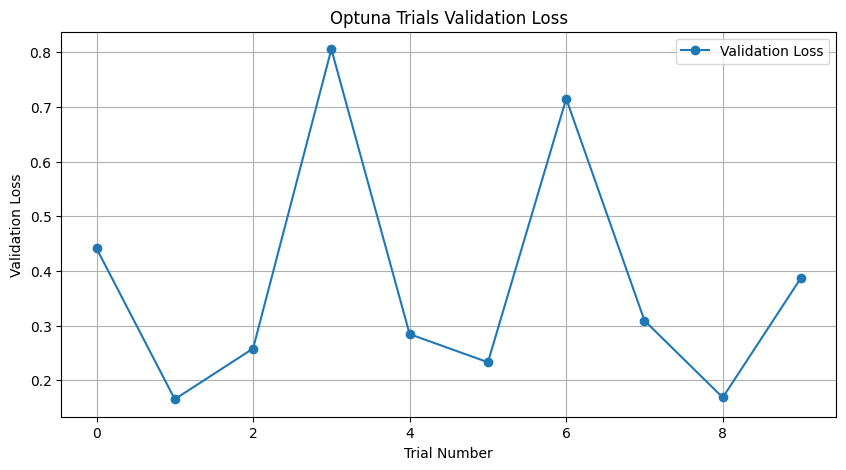

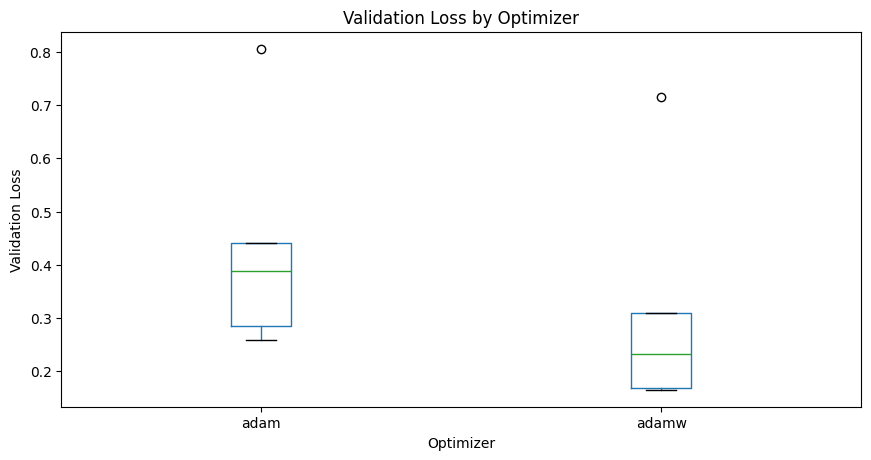

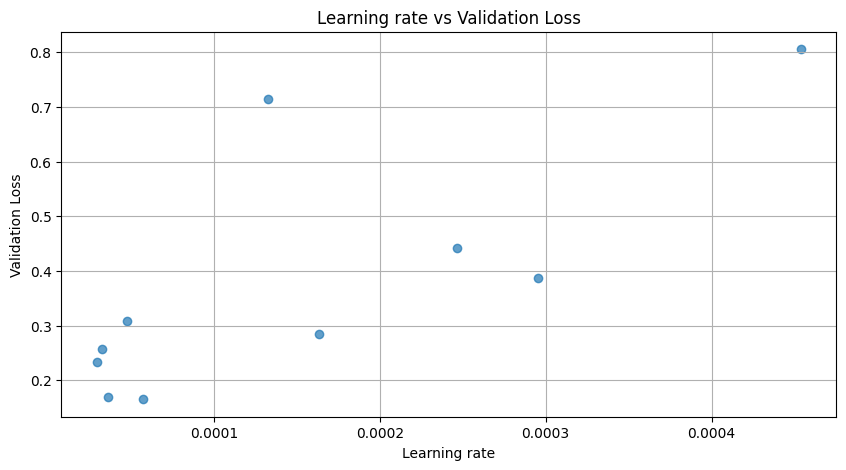

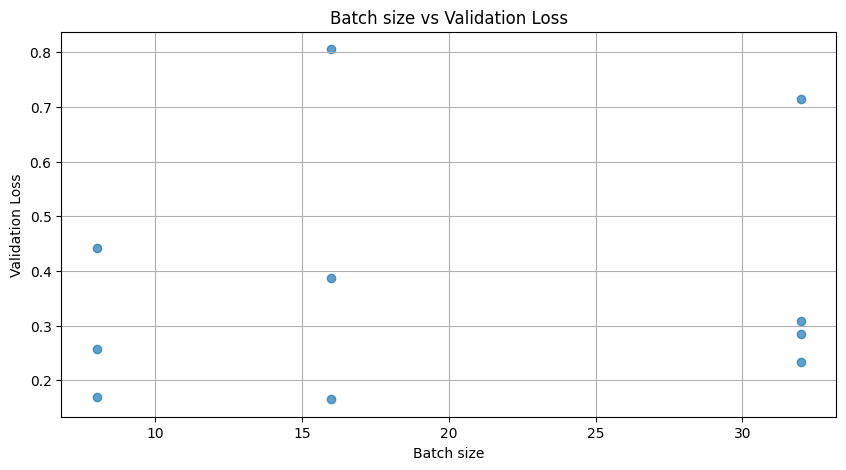

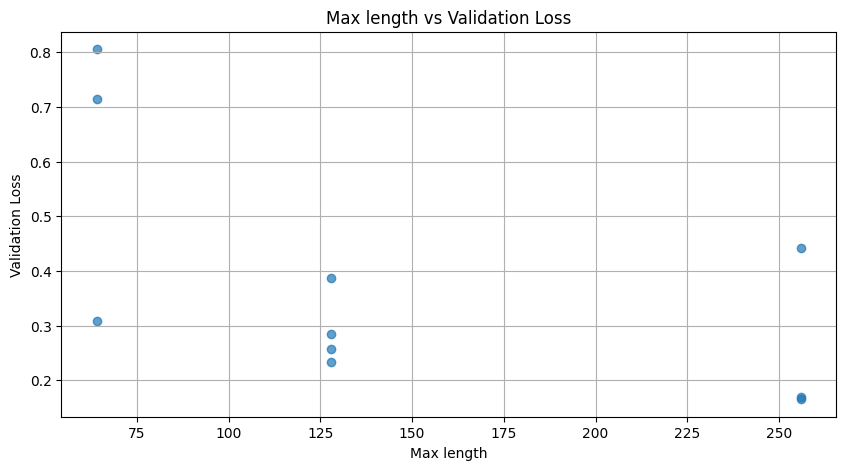

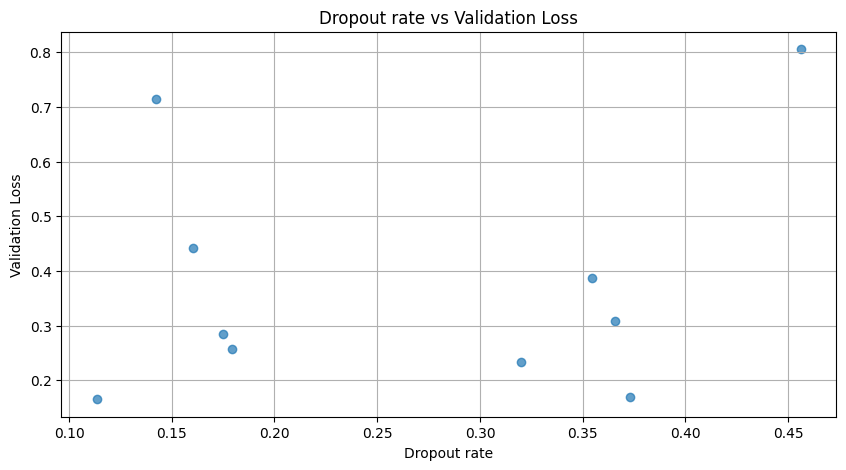

In [ ]:
plot_optuna_study_results(study)


From trial results above we can see that combination of adamw as optimizer, lower learning rates and higher max lengths results in the better performance during first epochs.

Training on best hyperparameters set found during 10 trials.

In [ ]:
MAX_LENGTH = 256
BATCH_SIZE = 16
LEARNING_RATE = 5.760880708042542e-05
NUM_LABELS = 2
DROPOUT_RATE = 0.11338180612630798
OPTIMIZER_NAME = "adamw"
MODEL_NAME = "distilbert-base-uncased"

In [ ]:
data_module = TextDataModule(train_df=train_data, val_df=val_data, tokenizer=tokenizer, max_length=MAX_LENGTH, batch_size=BATCH_SIZE)

In [ ]:
model_v2 = DistilBERTClassifier(model_name=MODEL_NAME, num_labels=NUM_LABELS, learning_rate=LEARNING_RATE,dropout_rate = DROPOUT_RATE, optimizer_name = OPTIMIZER_NAME)

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
csv_logger = CSVLogger(save_dir="logs", name="distilbert_v2_logs")

In [ ]:
early_stopping = pl.callbacks.EarlyStopping(monitor="val_loss", patience=3, mode="min")

In [ ]:
trainer = pl.Trainer(
    max_epochs=20,
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    logger=csv_logger,
    callbacks=[early_stopping],
)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [ ]:
trainer.fit(model_v2, datamodule=data_module)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:591: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type                                | Params | Mode 
------------------------------------------------------------------------
0 | model   | DistilBertForSequenceClassification | 67.0 M | eval 
1 | loss_fn | CrossEntropyLoss                    | 0      | train
2 | dropout | Dropout                             | 0      | train
------------------------------------------------------------------------
592 K     Trainable params
66.4 M    Non-trainable params
67.0 M    Total params
267.820   Total estimated model params size (MB)
2         Module

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [ ]:
def evaluate_on_validation(model, val_loader):
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for batch in val_loader:
            input_ids = batch["input_ids"].to(model.device)
            attention_mask = batch["attention_mask"].to(model.device)
            labels = batch["label"].to(model.device)

            logits = model(input_ids=input_ids, attention_mask=attention_mask)

            probs = torch.softmax(logits, dim=1)[:, 1]
            preds = torch.argmax(logits, dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print("Classification report:")
    print(classification_report(all_labels, all_preds, digits=4))

    conf_mat = confusion_matrix(all_labels, all_preds)
    sns.heatmap(conf_mat, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion matrix")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")
    plt.show()

    roc_auc = roc_auc_score(all_labels, all_probs)
    print(f"ROC-AUC: {roc_auc:.4f}")

    RocCurveDisplay.from_predictions(all_labels, all_probs)
    plt.title("ROC curve")
    plt.show()

In [ ]:
def plot_training_logs(log_csv_path):
    logs = pd.read_csv(log_csv_path)

    train_logs = logs[logs['train_loss'].notna()]
    val_logs = logs[logs['val_loss'].notna()]

    plt.figure(figsize=(10, 5))
    plt.plot(train_logs['epoch'], train_logs['train_acc'], label="Train accuracy")
    plt.plot(val_logs['epoch'], val_logs['val_acc'], label="Validation accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title("Training and validation accuracy")
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(train_logs['epoch'], train_logs['train_loss'], label="Train loss")
    plt.plot(val_logs['epoch'], val_logs['val_loss'], label="Validation loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training and validation loss")
    plt.legend()
    plt.show()

In [ ]:
val_dataset = TextDataset(val_data, tokenizer, MAX_LENGTH)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

Classification report:
              precision    recall  f1-score   support

           0     0.8937    0.9659    0.9284      2577
           1     0.9704    0.9069    0.9376      3179

    accuracy                         0.9333      5756
   macro avg     0.9320    0.9364    0.9330      5756
weighted avg     0.9361    0.9333    0.9335      5756



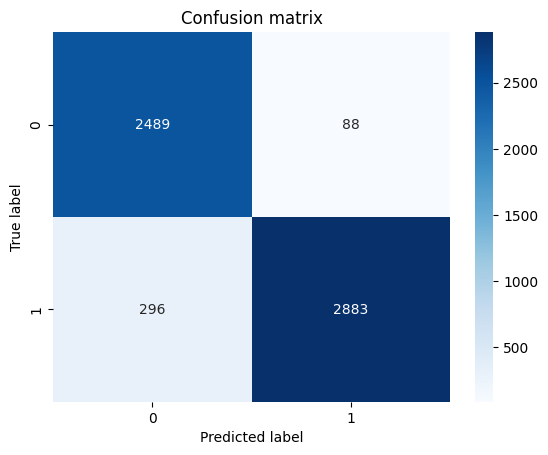

ROC-AUC: 0.9884


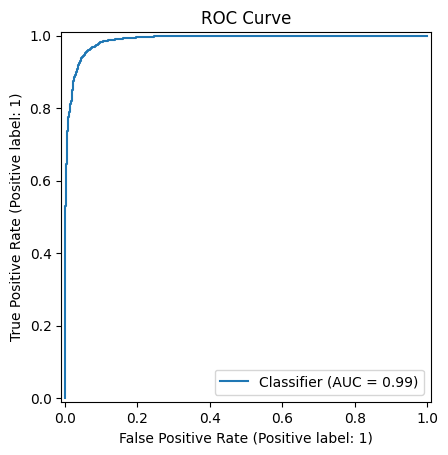

In [ ]:
evaluate_on_validation(model_v2, val_loader)

With tuned hyperparameters averall accuracy and f1 score improved to 93% and there is a lot less false text misclasification. There are 88 false positives and 296 false negatives which is indicating slightly higher misclassification in identifying the true articles. To address this we will include inversly proportional weights to the loss function.

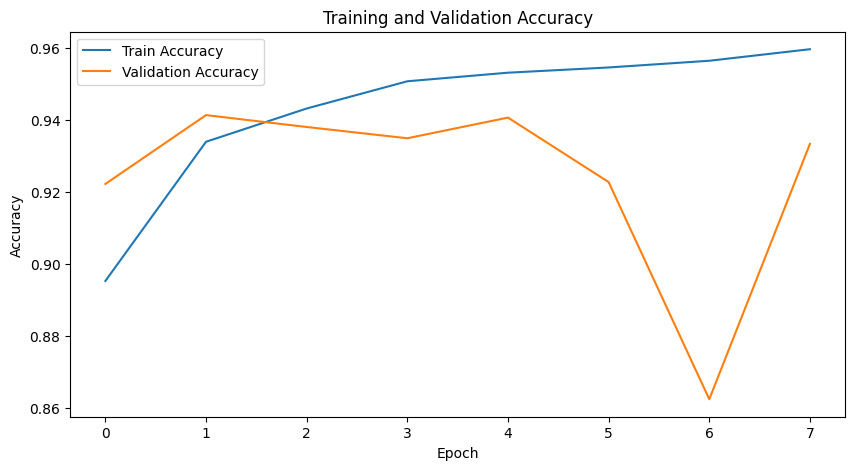

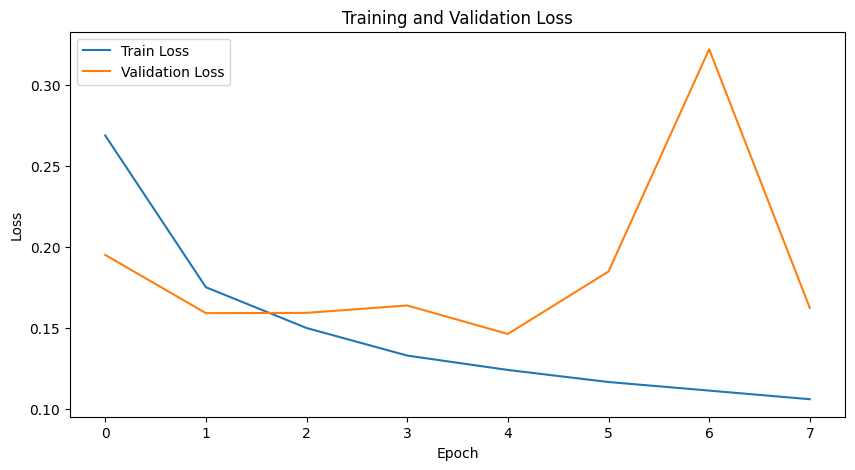

In [ ]:
log_csv_path = "/content/logs/distilbert_v2_logs/version_2/metrics.csv"
plot_training_logs(log_csv_path)

Training accuracy shows a steady increase and validation accuracy closely follows with spiking down at the 7th epoch. Model still seems to be a bit overfitting.

#### Integrating class weights

In [ ]:
classes = train_data["label"].unique()
class_weights = compute_class_weight("balanced", classes=classes, y=train_data["label"].values)
class_weights = dict(zip(classes, class_weights))
print("Class weights:", class_weights)

Class weights: {True: 0.9054136048001079, False: 1.1166541947285276}


In [ ]:
class DistilBERTClassifierWeighted(pl.LightningModule):
    def __init__(self, model_name, num_labels, learning_rate, dropout_rate, optimizer_name, class_weights=None):
        super(DistilBERTClassifierWeighted, self).__init__()
        self.model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=num_labels)
        self.learning_rate = learning_rate
        self.dropout_rate = dropout_rate
        self.optimizer_name = optimizer_name

        if class_weights is not None:
            self.loss_fn = nn.CrossEntropyLoss(weight=torch.tensor(class_weights, dtype=torch.float32))
        else:
            self.loss_fn = nn.CrossEntropyLoss()

        for param in self.model.distilbert.parameters():
            param.requires_grad = False

        self.dropout = nn.Dropout(self.dropout_rate)

    def forward(self, input_ids, attention_mask):
        outputs = self.model(input_ids=input_ids, attention_mask=attention_mask)
        logits = self.dropout(outputs.logits)
        return logits

    def training_step(self, batch, batch_idx):
        logits = self(input_ids=batch["input_ids"], attention_mask=batch["attention_mask"])
        loss = self.loss_fn(logits, batch["label"])
        preds = torch.argmax(logits, dim=1)
        acc = (preds == batch["label"]).float().mean()

        self.log("train_loss", loss, on_step=False, on_epoch=True, batch_size=len(batch["label"]))
        self.log("train_acc", acc, on_step=False, on_epoch=True, batch_size=len(batch["label"]))
        return loss

    def validation_step(self, batch, batch_idx):
        logits = self(input_ids=batch["input_ids"], attention_mask=batch["attention_mask"])
        val_loss = self.loss_fn(logits, batch["label"])
        preds = torch.argmax(logits, dim=1)
        acc = (preds == batch["label"]).float().mean()

        self.log("val_loss", val_loss, on_step=False, on_epoch=True, batch_size=len(batch["label"]))
        self.log("val_acc", acc, on_step=False, on_epoch=True, batch_size=len(batch["label"]))

    def configure_optimizers(self):
        if self.optimizer_name == "adamw":
            optimizer = AdamW(self.parameters(), lr=self.learning_rate, weight_decay=0.01)
        elif self.optimizer_name == "adam":
            optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        else:
            raise ValueError("Unsupported optimizer. Choose either 'adam' or 'adamw'.")

        scheduler = {
            "scheduler": torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", patience=2, factor=0.5, verbose=True),
            "monitor": "val_loss",
            "interval": "epoch",
            "frequency": 1,
        }

        return [optimizer], [scheduler]

In [ ]:
model_v3 = DistilBERTClassifierWeighted(
    model_name=MODEL_NAME,
    num_labels=NUM_LABELS,
    learning_rate=LEARNING_RATE,
    dropout_rate=DROPOUT_RATE,
    optimizer_name=OPTIMIZER_NAME,
    class_weights=[class_weights[i] for i in range(NUM_LABELS)]
)

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
csv_logger = CSVLogger(save_dir="logs", name="distilbert_v3_logs")

In [ ]:
early_stopping = pl.callbacks.EarlyStopping(monitor="val_loss", patience=3, mode="min")

In [ ]:
trainer = pl.Trainer(
    max_epochs=20,
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    logger=csv_logger,
    callbacks=[early_stopping],
)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [ ]:
trainer.fit(model_v3, datamodule=data_module)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type                                | Params | Mode 
------------------------------------------------------------------------
0 | model   | DistilBertForSequenceClassification | 67.0 M | eval 
1 | loss_fn | CrossEntropyLoss                    | 0      | train
2 | dropout | Dropout                             | 0      | train
------------------------------------------------------------------------
592 K     Trainable params
66.4 M    Non-trainable params
67.0 M    Total params
267.820   Total estimated model params size (MB)
2         Modules in train mode
96        Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Classification report:
              precision    recall  f1-score   support

           0     0.8590    0.9744    0.9131      2577
           1     0.9767    0.8704    0.9205      3179

    accuracy                         0.9170      5756
   macro avg     0.9179    0.9224    0.9168      5756
weighted avg     0.9240    0.9170    0.9172      5756



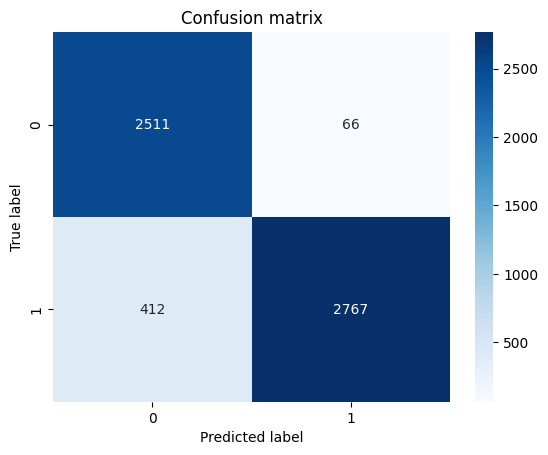

ROC-AUC: 0.9875


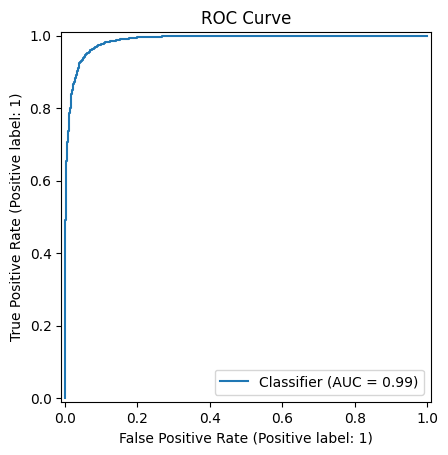

In [ ]:
evaluate_on_validation(model_v3, val_loader)

We can see that overall results with class weights are a bit worse than without. However less false texts were misclassified, but a lot more true text were misclassified as false.

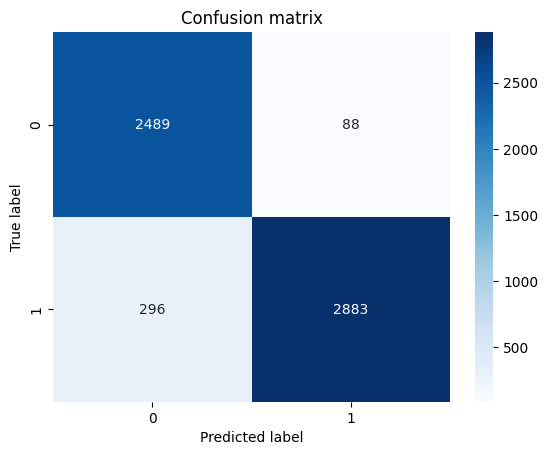

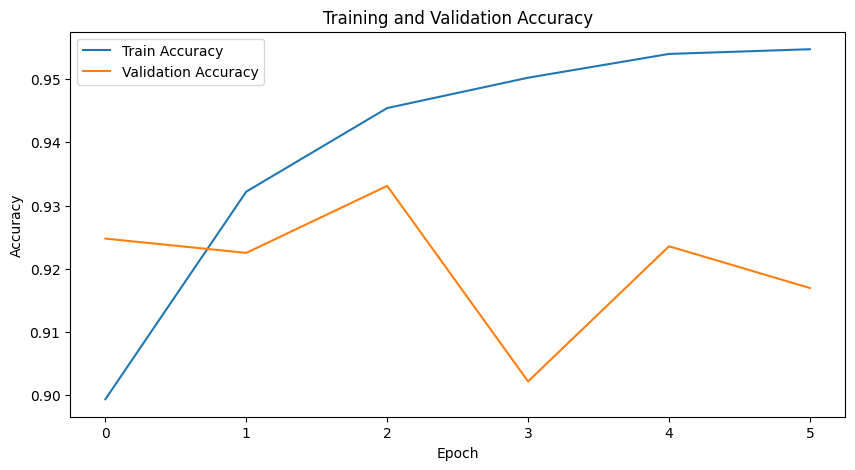

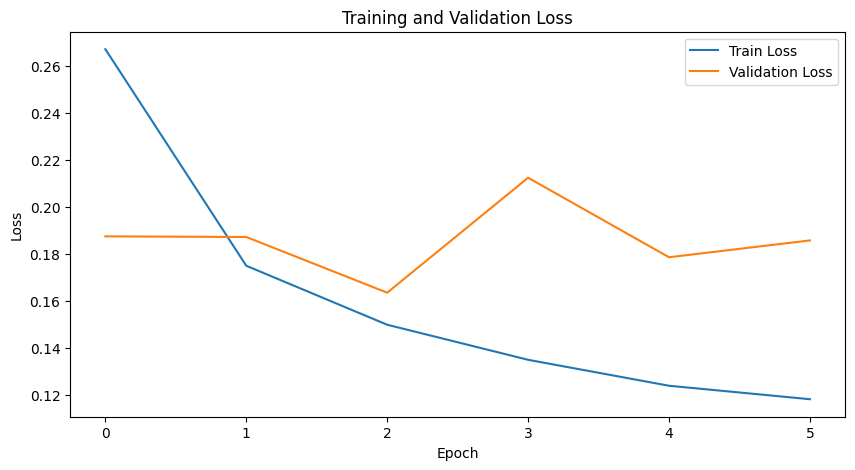

In [ ]:
log_csv_path = "/content/logs/distilbert_v2_logs/version_3/metrics.csv"
plot_training_logs(log_csv_path)

Class weights have reduced the spike that we saw before, but no other effect can be noticed.

We will compare all four models using different approaches. To ensure consistency across the models we will include titles text in the dataset ensuring that all models are trained and evaluated using the same data.

In [ ]:
class CombinedTextDataset(Dataset):
    def __init__(self, dataframe, tokenizer, max_length):
        self.dataframe = dataframe
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        text = self.dataframe.iloc[idx]["processed_text"]
        title = self.dataframe.iloc[idx]["processed_title"]
        label = self.dataframe.iloc[idx]["label"]

        combined_text = f"{title} [SEP] {text}"
        encoding = self.tokenizer(
            combined_text,
            max_length=self.max_length,
            padding="max_length",
            truncation=True,
            return_tensors="pt",
        )
        return {
            "input_ids": encoding["input_ids"].squeeze(0),
            "attention_mask": encoding["attention_mask"].squeeze(0),
            "label": torch.tensor(label, dtype=torch.long),
        }

In [ ]:
class CombinedTextDataModule(pl.LightningDataModule):
    def __init__(self, train_df, val_df, tokenizer, max_length, batch_size):
        super().__init__()
        self.train_df = train_df
        self.val_df = val_df
        self.tokenizer = tokenizer
        self.max_length = max_length
        self.batch_size = batch_size

    def setup(self, stage=None):
        self.train_dataset = CombinedTextDataset(self.train_df, self.tokenizer, self.max_length)
        self.val_dataset = CombinedTextDataset(self.val_df, self.tokenizer, self.max_length)

    def train_dataloader(self):
        return DataLoader(self.train_dataset, batch_size=self.batch_size, shuffle=True)

    def val_dataloader(self):
        return DataLoader(self.val_dataset, batch_size=self.batch_size, shuffle=False)

In [ ]:
class CombinedDistilBERTClassifier(pl.LightningModule):
    def __init__(self, model_name, num_labels, learning_rate, dropout_rate, optimizer_name):
        super(CombinedDistilBERTClassifier, self).__init__()
        self.model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=num_labels)
        self.learning_rate = learning_rate
        self.dropout_rate = dropout_rate
        self.optimizer_name = optimizer_name
        self.loss_fn = nn.CrossEntropyLoss()

        for param in self.model.distilbert.parameters():
            param.requires_grad = False

        self.dropout = nn.Dropout(self.dropout_rate)

    def forward(self, input_ids, attention_mask):
        outputs = self.model(input_ids=input_ids, attention_mask=attention_mask)
        logits = self.dropout(outputs.logits)
        return logits

    def training_step(self, batch, batch_idx):
        logits = self(input_ids=batch["input_ids"], attention_mask=batch["attention_mask"])
        loss = self.loss_fn(logits, batch["label"])
        preds = torch.argmax(logits, dim=1)
        acc = (preds == batch["label"]).float().mean()

        self.log("train_loss", loss, on_step=False, on_epoch=True, batch_size=len(batch["label"]))
        self.log("train_acc", acc, on_step=False, on_epoch=True, batch_size=len(batch["label"]))
        return loss

    def validation_step(self, batch, batch_idx):
        logits = self(input_ids=batch["input_ids"], attention_mask=batch["attention_mask"])
        val_loss = self.loss_fn(logits, batch["label"])
        preds = torch.argmax(logits, dim=1)
        acc = (preds == batch["label"]).float().mean()

        self.log("val_loss", val_loss, on_step=False, on_epoch=True, batch_size=len(batch["label"]))
        self.log("val_acc", acc, on_step=False, on_epoch=True, batch_size=len(batch["label"]))

    def configure_optimizers(self):
        if self.optimizer_name == "adamw":
            optimizer = AdamW(self.parameters(), lr=self.learning_rate, weight_decay=0.01)
        elif self.optimizer_name == "adam":
            optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        else:
            raise ValueError("Unsupported optimizer. Choose either 'adam' or 'adamw'.")

        scheduler = {
            "scheduler": torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", patience=2, factor=0.5, verbose=True),
            "monitor": "val_loss",
            "interval": "epoch",
            "frequency": 1,
        }

        return [optimizer], [scheduler]

In [ ]:
MAX_LENGTH = 256
BATCH_SIZE = 16
LEARNING_RATE = 5.760880708042542e-05
NUM_LABELS = 2
DROPOUT_RATE = 0.11338180612630798
OPTIMIZER_NAME = "adamw"
MODEL_NAME = "distilbert-base-uncased"

In [ ]:
train_data = train_df_masked[["processed_text", "processed_title", "label"]].copy()
val_data = val_df_masked[["processed_text", "processed_title", "label"]].copy()

In [ ]:
test_data = val_df_masked[["processed_text", "processed_title", "label"]].copy()

In [ ]:
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [ ]:
data_module = CombinedTextDataModule(train_df=train_data, val_df=val_data, tokenizer=tokenizer, max_length=MAX_LENGTH, batch_size=BATCH_SIZE)

In [ ]:
model_v4 = CombinedDistilBERTClassifier(
    model_name=MODEL_NAME,
    num_labels=NUM_LABELS,
    learning_rate=LEARNING_RATE,
    dropout_rate=DROPOUT_RATE,
    optimizer_name=OPTIMIZER_NAME,
)

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
csv_logger = CSVLogger(save_dir="logs", name="distilbert_combined_logs")

In [ ]:
early_stopping = pl.callbacks.EarlyStopping(monitor="val_loss", patience=3, mode="min")

In [ ]:
trainer = pl.Trainer(
    max_epochs=20,
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    logger=csv_logger,
    callbacks=[early_stopping],
)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [ ]:
trainer.fit(model_v4, datamodule=data_module)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:591: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type                                | Params | Mode 
------------------------------------------------------------------------
0 | model   | DistilBertForSequenceClassification | 67.0 M | eval 
1 | loss_fn | CrossEntropyLoss                    | 0      | train
2 | dropout | Dropout                             | 0      | train
------------------------------------------------------------------------
592 K     Trainable params
66.4 M    Non-trainable params
67.0 M    Total params
267.820   Total estimated model params size (MB)
2         Module

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [ ]:
val_loader = data_module.val_dataloader()

Classification report:
              precision    recall  f1-score   support

           0     0.9263    0.9612    0.9434      2577
           1     0.9676    0.9380    0.9526      3179

    accuracy                         0.9484      5756
   macro avg     0.9469    0.9496    0.9480      5756
weighted avg     0.9491    0.9484    0.9485      5756



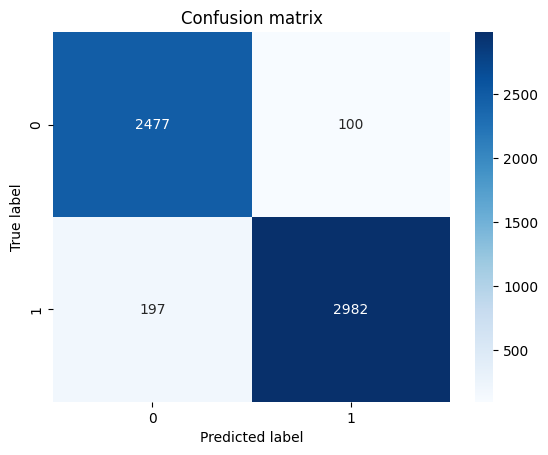

ROC-AUC: 0.9905


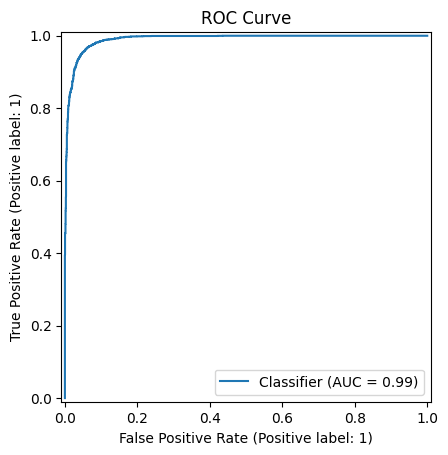

In [ ]:
evaluate_on_validation(model_v4, val_loader)

With added title we have improved our results quite a lot to 95% accuracy and f1 score. Classification report of the last model of only articles text:


```
Classification report:
              precision    recall  f1-score   support

           0     0.8590    0.9744    0.9131      2577
           1     0.9767    0.8704    0.9205      3179

    accuracy                         0.9170      5756
   macro avg     0.9179    0.9224    0.9168      5756
weighted avg     0.9240    0.9170    0.9172      5756
```

We have around 300 misclassification with more misclassifications of true articles 197 > 100.


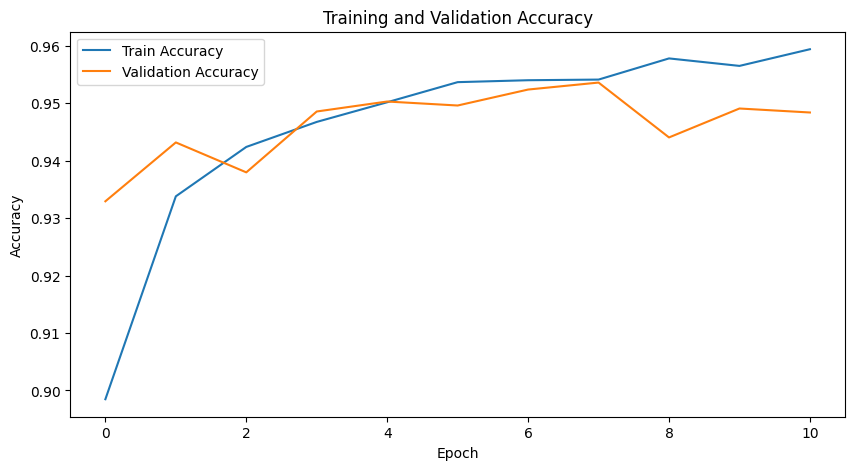

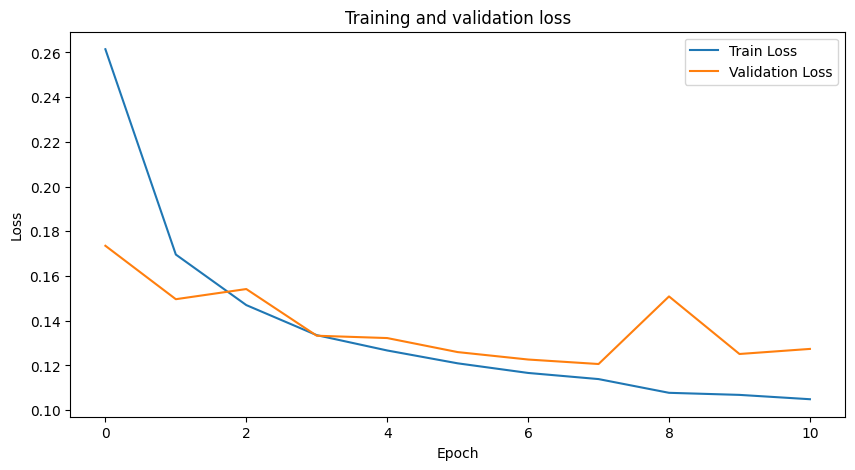

In [ ]:
log_csv_path = "/content/logs/distilbert_combined_logs/version_1/metrics.csv"
plot_training_logs(log_csv_path)

This also improved model fluctuations and is now converging and generalizing well the validation texts and titles.

#### Mistakes analysis

In [ ]:
from lime.lime_text import LimeTextExplainer

In [ ]:
checkpoint_path = "/content/epoch=10-step=18469.ckpt"

In [ ]:
model_v4 = CombinedDistilBERTClassifier.load_from_checkpoint(
    checkpoint_path,
    model_name=MODEL_NAME,
    num_labels=NUM_LABELS,
    learning_rate=LEARNING_RATE,
    dropout_rate=DROPOUT_RATE,
    optimizer_name=OPTIMIZER_NAME
)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
data_module.setup()

In [ ]:
val_loader = data_module.val_dataloader()

In [ ]:
def get_misclassified_samples(model, val_loader, val_df):
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = []
    indices = []

    with torch.no_grad():
        for batch_idx, batch in enumerate(val_loader):
            input_ids = batch["input_ids"].to(model.device)
            attention_mask = batch["attention_mask"].to(model.device)
            labels = batch["label"].to(model.device)

            logits = model(input_ids=input_ids,
                           attention_mask=attention_mask)
            probs = torch.softmax(logits, dim=1)
            preds = torch.argmax(logits, dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
            indices.extend(batch.get("index", list(range(len(batch["label"])))) if "index" in batch else range(len(labels)))

    results = pd.DataFrame({
        "index": indices,
        "predicted_label": all_preds,
        "true_label": all_labels,
        "confidence": [p.max() for p in all_probs]
    })

    results = results.merge(val_df.reset_index(), left_on="index", right_index=True)
    mistakes = results[results["predicted_label"] != results["true_label"]]

    print(f"Total misclassified: {len(mistakes)}")
    return mistakes

In [ ]:
val_mistakes = get_misclassified_samples(model_v4, val_loader, val_data)

Total misclassified: 297


In [ ]:
val_mistakes.to_csv("misclassified_samples.csv", index=False)

In [ ]:
for _, row in val_mistakes.head(5).iterrows():
    print(f"Processed text: {row['processed_text']}")
    print(f"Processed title: {row['processed_title']}")
    print(f"True label: {row['true_label']}")
    print(f"Predicted label: {row['predicted_label']}")
    print("----")

Processed text: paris reuter criticism of europe by u s president elect donald trump only serve to reinforce european solidarity french finance minister michel sapin say on tuesday trump say german chancellor angela merkel have make a catastrophic mistake with her open door policy on migration accord to an interview publish on sunday by german newspaper bild the more he trump make this sort of statement the more europeans close rank sapin tell reporter add that such criticism be unacceptable the attack on the chancellor be not an argument we can accept as frenchman or as european ask whether europe would have to react if the united states decide to slap a percent tax on import sapin say we will all have time to see whether there s a difference between the content of a tweet and the law that will be pass trump be quote as tell bild he would impose a percent levy on german make car import to the u s market a plan that draw sharp rebuke from berlin and hit automaker share i would tell bmw

It's hard to say what excatly causes misclassifications in these cases. We are going to use LIME analysis to examine which parts of the text or title contribute most to the predictions.

In [ ]:
def lime_analysis(row, model, tokenizer, max_length, num_features=10, num_samples=1000):
    combined_text = f"{row['processed_title']} [SEP] {row['processed_text']}"

    device = next(model.parameters()).device

    def predict_proba(texts):
        tokenized = tokenizer(
            texts,
            max_length=max_length,
            padding="max_length",
            truncation=True,
            return_tensors="pt"
        )
        input_ids = tokenized["input_ids"].to(device)
        attention_mask = tokenized["attention_mask"].to(device)

        with torch.no_grad():
            logits = model(input_ids=input_ids, attention_mask=attention_mask)
            probs = torch.softmax(logits, dim=1).cpu().numpy()
        return probs

    explainer = LimeTextExplainer(class_names=["Class 0", "Class 1"])

    exp = explainer.explain_instance(
        combined_text, predict_proba, num_features=num_features, num_samples=num_samples
    )

    print(f"Processed title: {row['processed_title']}")
    print(f"Processed text: {row['processed_text']}")
    print(f"True label: {row['true_label']}")
    print(f"Predicted label: {row['predicted_label']}")
    print(f"Confidence: {row['confidence']:.2f}")
    exp.show_in_notebook(text=True)
    print("----")

In [ ]:
for _, row in val_mistakes.head(3).iterrows():
    torch.cuda.empty_cache()
    lime_analysis(row, model_v4, tokenizer, max_length=MAX_LENGTH, num_features=10, num_samples=500)

Processed title: trump criticism only draw europeans close say french minister
Processed text: paris reuter criticism of europe by u s president elect donald trump only serve to reinforce european solidarity french finance minister michel sapin say on tuesday trump say german chancellor angela merkel have make a catastrophic mistake with her open door policy on migration accord to an interview publish on sunday by german newspaper bild the more he trump make this sort of statement the more europeans close rank sapin tell reporter add that such criticism be unacceptable the attack on the chancellor be not an argument we can accept as frenchman or as european ask whether europe would have to react if the united states decide to slap a percent tax on import sapin say we will all have time to see whether there s a difference between the content of a tweet and the law that will be pass trump be quote as tell bild he would impose a percent levy on german make car import to the u s market a p

----
Processed title: high school principal confiscate yearbook from student after discover senior used favorite trump quote in profile
Processed text: hey parent be you wake yet a high school in north carolina confiscate student yearbook after one of the student quote president trump as her senior quote the charlotte observer report administrator at richmond early college high school a public high school in hamlet find several quote include a quote by the president to be inappropriate one of the allegedly offensive quote accord to richmond county school district spokeswoman ashley michelle thublin be trump s pledge to build that wall in a statement on the richmond county school website and the richmond county school facebook page the district say the yearbook have error and inappropriate comment the district also say we do not and will not tolerate inappropriate conduct toward any of our student
True label: 0
Predicted label: 1
Confidence: 0.87


----
Processed title: boiler room smoke gunz
Processed text: tune in to the alternate current radio network acr for another live broadcast of the boiler room tonight pm pst pm cst pm e for this special broadcast join we for uncensored uninterruptible talk radio custom make for bar fly philosopher misguide moralist masochist street corner evangelist medium maniac savant political animal and otherwise lovable rascal join acr host hesher and spore along with daniel spaulde of soul of the east funk soul randy j stewart howe acr wire contributor and andy nowicki author of conspiracy compliance control defiance for the hundred and third episode of boiler room turn it up tune in and hang with the acr brain trust for this week boil down and analysis and the usual gnashing of the tooth of the political animal in the social reject club listen to boiler room smoke gunz on spreaker direct download episode please like and share the program and visit our donate page to get involve reference link
Tru

----


If we look at the first text analyzed with LIME above we can see that the model classified it as false text with a confidence of 0.56, while it is actually true text. For the true class words like say, that, to and criticism are the main contributors to the prediction. For false texts stop words seem to be dominating and overtaking the prediction. It could be better for the model to try processing text without stop words. In the last of the 3 texts analyzed with LIME above we can see similar situations where the model relied heavily on stop words.

#### Models comparison

In [ ]:
def evaluate_logistic_feature_engineering(model, X_test, y_test):
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]

    print("Logistic regression with engineered features")
    print(classification_report(y_test, y_pred))

    roc_auc = roc_auc_score(y_test, y_prob)
    print(f"ROC-AUC: {roc_auc:.4f}")

In [ ]:
evaluate_logistic_feature_engineering(best_log_model, X_test_rfe, y_test_scaled)

Logistic regression with engineered features
              precision    recall  f1-score   support

           0       0.93      0.90      0.91      2577
           1       0.92      0.94      0.93      3179

    accuracy                           0.92      5756
   macro avg       0.93      0.92      0.92      5756
weighted avg       0.92      0.92      0.92      5756

ROC-AUC: 0.9724


In [ ]:
def evaluate_logistic_tfidf(model, X_test_tf, y_test_tf):
    y_pred = model.predict(X_test_tf)
    y_prob = model.predict_proba(X_test_tf)[:, 1]

    print("TF-IDF logistic regression:")
    print(classification_report(y_test_tf, y_pred))

    roc_auc = roc_auc_score(y_test_tf, y_prob)
    print(f"ROC-AUC: {roc_auc:.4f}")

In [ ]:
evaluate_logistic_tfidf(logistic_model_tf, X_test_tf, y_test_tf)

TF-IDF logistic regression:
              precision    recall  f1-score   support

           0       0.93      0.98      0.96      2577
           1       0.98      0.94      0.96      3179

    accuracy                           0.96      5756
   macro avg       0.96      0.96      0.96      5756
weighted avg       0.96      0.96      0.96      5756

ROC-AUC: 0.9945


In [ ]:
def evaluate_random_forest(model, X_test, y_test):
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]

    print("Random forest performance:")
    print(classification_report(y_test, y_pred))

    roc_auc = roc_auc_score(y_test, y_prob)
    print(f"ROC-AUC: {roc_auc:.4f}")

In [ ]:
evaluate_random_forest(best_rf_model, X_test, y_test)

Random forest performance:
              precision    recall  f1-score   support

           0       0.94      0.92      0.93      2577
           1       0.93      0.95      0.94      3179

    accuracy                           0.94      5756
   macro avg       0.94      0.93      0.93      5756
weighted avg       0.94      0.94      0.94      5756

ROC-AUC: 0.9830


In [ ]:
def evaluate_distilbert(model, test_loader):
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for batch in test_loader:
            input_ids = batch["input_ids"].to(model.device)
            attention_mask = batch["attention_mask"].to(model.device)
            labels = batch["label"].to(model.device)
            logits = model(input_ids=input_ids, attention_mask=attention_mask)
            probs = torch.softmax(logits, dim=1)[:, 1]
            preds = torch.argmax(logits, dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    print("DistilBERT performance:")
    print(classification_report(all_labels, all_preds))

    roc_auc = roc_auc_score(all_labels, all_probs)
    print(f"ROC-AUC: {roc_auc:.4f}")

In [ ]:
val_dataset = TextDataset(test_data, tokenizer, MAX_LENGTH)

In [ ]:
test_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

In [ ]:
evaluate_distilbert(model_v4, test_loader)

DistilBERT performance:
              precision    recall  f1-score   support

           0       0.90      0.95      0.93      2577
           1       0.96      0.92      0.94      3179

    accuracy                           0.93      5756
   macro avg       0.93      0.94      0.93      5756
weighted avg       0.94      0.93      0.93      5756

ROC-AUC: 0.9845


#### Conclusions



```
Logistic regression with engineered features
              precision    recall  f1-score   support

           0       0.93      0.90      0.91      2577
           1       0.92      0.94      0.93      3179

    accuracy                           0.92      5756
   macro avg       0.93      0.92      0.92      5756
weighted avg       0.92      0.92      0.92      5756
```


```
TF-IDF logistic regression:
              precision    recall  f1-score   support

           0       0.93      0.98      0.96      2577
           1       0.98      0.94      0.96      3179

    accuracy                           0.96      5756
   macro avg       0.96      0.96      0.96      5756
weighted avg       0.96      0.96      0.96      5756
```


```
Random forest performance:
              precision    recall  f1-score   support

           0       0.94      0.92      0.93      2577
           1       0.93      0.95      0.94      3179

    accuracy                           0.94      5756
   macro avg       0.94      0.93      0.93      5756
weighted avg       0.94      0.94      0.94      5756
```



```
DistilBERT performance:
              precision    recall  f1-score   support

           0       0.90      0.95      0.93      2577
           1       0.96      0.92      0.94      3179

    accuracy                           0.93      5756
   macro avg       0.93      0.94      0.93      5756
weighted avg       0.94      0.93      0.93      5756
```

All 4 models demonstrated similiar performance as with validation sets on test set. TF-IDF embedding based Logistic regression showed the best results, however most likely it fits only this type of data and wouldn't do well with different type of news data with different context. Random forest model which was based on engineered features had best results with that type of data and could potentially work better with different type of text data rather that only political or news texts. DistilBERT could potentially generalize well different type of texts, however we noticed before how relying on stop words this model is and it rare cases it leads to misclassifications.

Next steps would be evaluating models on texts that did not came from this set, any sort of text from the web. With enough samples find best generalizing model and work on improving that model. Trying more different features, in DistilBERT model case removing stop words, if necessary tuning more layers and explore the performance. Also we saw slight overfitting which was not addressed completely.

We also should review data ore carefully we were able to find some nonsensical text or really short ones with very little context or some that are only links. These texts can skew model and more extensive data cleaning could potentialy improve these model results.

Also we only did one experiment with entities masking, it would be great to compare different approaches results.